# COMP30850 Assignment 2 - Social Media Network Analysis

Name:Mohammed Alshehri
    
Student Number:19209233
    
    
Topic Selected: Technology

# Assignment Details:
create and characterise a range of different network
representations, created from pre-collected Twitter data for a specific Twitter List of
user accounts that relates to a specific topic

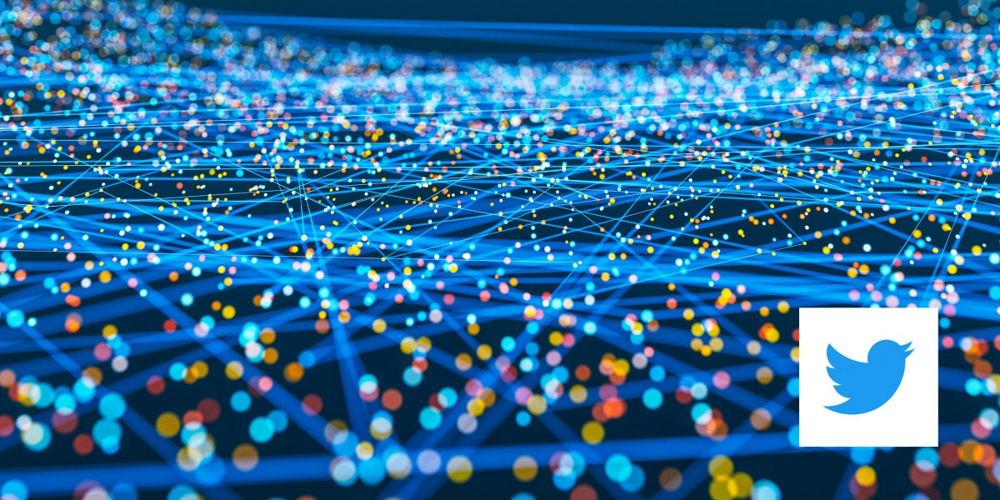

DataSet Urls:
http://mlg.ucd.ie/modules/COMP30850/lists/datasets/technology.zip

# Task 1: Follower network:

In [333]:
#importing libiraies That are needed
import networkx as nx
import pandas as pd
import collections
from typing import Union
import seaborn as sns
import json
import itertools
from collections import Counter
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
%matplotlib inline
import matplotlib.colors as mcolors
import operator
from datetime import datetime
from email.utils import parsedate
from matplotlib.lines import Line2D
from networkx import NetworkXError
import matplotlib.lines as mlines
from networkx.algorithms import bipartite

pd.options.display.max_rows = None
pd.options.display.max_columns = None

Now we weill create a function that will Check the CSV file named "followers.csv" and prints its contents:

In [334]:
# read the CSV file into a pandas DataFrame
df = pd.read_csv('followers.csv')

In [335]:
print(df)

                        source\ttarget\tdate
0         engadget\thuffposttech\t2020-10-16
1               mashable\tgigaom\t2021-04-09
2         huffposttech\tcnetnews\t2021-06-22
3         huffposttech\tmashable\t2021-07-02
4               techradar\twired\t2022-02-23
5          reuterstech\tcnetnews\t2020-04-24
6             gigaom\ttechreview\t2020-06-08
7       forbestech\tguardiantech\t2021-05-15
8              pcmag\ttechcrunch\t2020-08-17
9                techreview\trww\t2021-01-01
10       techreview\tfutureshift\t2022-12-20
11           techradar\tengadget\t2020-10-01
12       technology\tventurebeat\t2020-09-17
13         venturebeat\tengadget\t2021-01-29
14       reuterstech\tfttechnews\t2021-09-09
15                cnet\tengadget\t2022-02-28
16       forbestech\tventurebeat\t2020-08-23
17            mashable\tcnetnews\t2020-07-11
18             gizmodo\tengadget\t2020-10-01
19              gigaom\tmashable\t2020-07-03
20      huffposttech\tforbestech\t2022-06-25
21        

Now we will construct A network for "Followers.csv" which is  A tab-separated text file, indicating the friend/follower relations between pairs of list members. The first two columns contain a pair of ordered screen names X and Y, indicating that user X follows user Y. The third column indicates the date on which X started following Y.

In [336]:
# reading the followers csv and displaying the top 25
followerNetwork = pd.read_csv("followers.csv",  header = None,sep="\t")
# displaying all they way to 10 rows
followerNetwork.head(25)

,0,1,2
0,source,target,date
1,engadget,huffposttech,2020-10-16
2,mashable,gigaom,2021-04-09
3,huffposttech,cnetnews,2021-06-22
4,huffposttech,mashable,2021-07-02
5,techradar,wired,2022-02-23
6,reuterstech,cnetnews,2020-04-24
7,gigaom,techreview,2020-06-08
8,forbestech,guardiantech,2021-05-15
9,pcmag,techcrunch,2020-08-17


Now we created a directed graph and populates it with edges from the followerNetwork DataFrame. The resulting graph represents a network of followers, where each node represents a user and each directed edge represents a "following" relationship from one user to another.

In [337]:
my_directed_graph = nx.DiGraph()

for index, row in followerNetwork.iterrows():
    my_directed_graph.add_edge(row[0], row[1])


In [338]:
# Adding edges to the graph
my_directed_graph.add_edges_from([(1, 2), (2, 3), (3, 4), (4, 1)])

# Looping through edges and printing them
for edge in my_directed_graph.edges():
    print("Connected from: ", edge[0], " to: ", edge[1])

Connected from:  source  to:  target
Connected from:  engadget  to:  huffposttech
Connected from:  engadget  to:  verge
Connected from:  engadget  to:  mashable
Connected from:  engadget  to:  cnet
Connected from:  engadget  to:  gizmodo
Connected from:  engadget  to:  techcrunch
Connected from:  engadget  to:  wsjtech
Connected from:  engadget  to:  wired
Connected from:  engadget  to:  thenextweb
Connected from:  huffposttech  to:  cnetnews
Connected from:  huffposttech  to:  mashable
Connected from:  huffposttech  to:  forbestech
Connected from:  huffposttech  to:  techcrunch
Connected from:  huffposttech  to:  cnntech
Connected from:  huffposttech  to:  usatodaytech
Connected from:  huffposttech  to:  gizmodo
Connected from:  huffposttech  to:  thenextweb
Connected from:  huffposttech  to:  telegraphtech
Connected from:  huffposttech  to:  technology
Connected from:  huffposttech  to:  guardiantech
Connected from:  huffposttech  to:  wired
Connected from:  huffposttech  to:  wsjtec

Now we are gonna Display the number of edges and nodes in the Network.

In [339]:
# Number of nodes and edges
num_nodes = my_directed_graph.number_of_nodes()
num_edges = my_directed_graph.number_of_edges()

# Printing the results
print("Number of nodes: ", num_nodes)
print("Number of edges: ", num_edges)

Number of nodes:  38
Number of edges:  264


Visualising the Network To see the nodes and edges for the following network

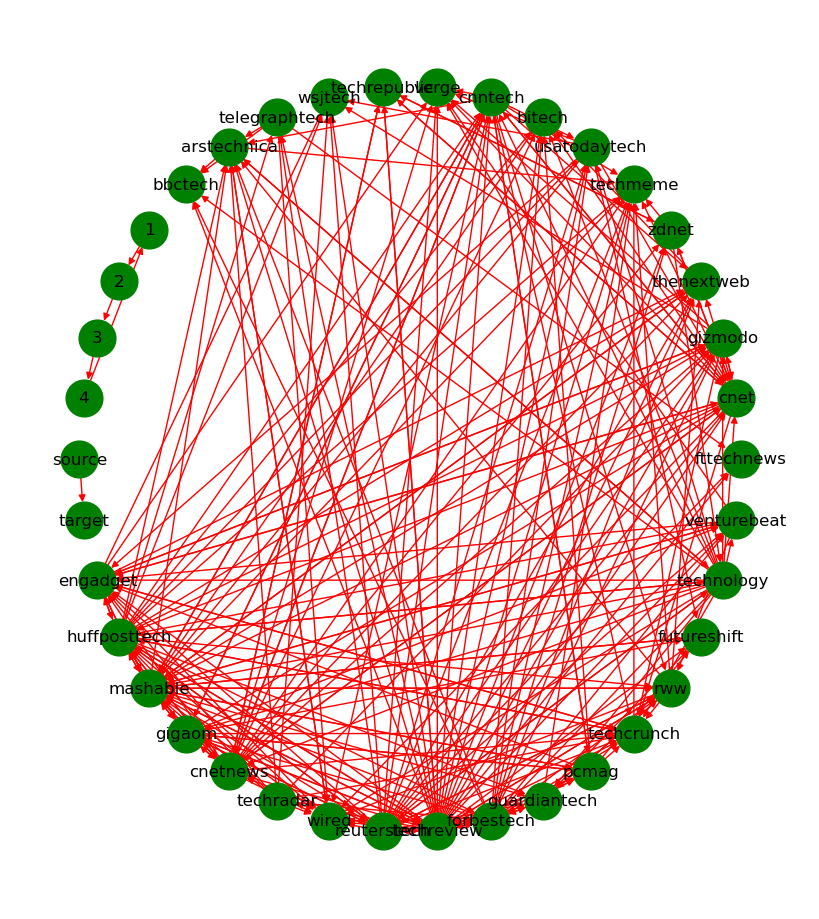

Number of nodes: 38
Number of edges: 264


In [340]:
#drawing a grpah for the follower network
plt.figure(figsize=(8,9))
nx.draw_shell(my_directed_graph, with_labels=True, node_size=700, node_color="green",edge_color="red" )
plt.axis("off")
plt.show()
# printing the number of nodes and edges below the graph 
print("Number of nodes:",my_directed_graph.number_of_nodes())
print("Number of edges:",my_directed_graph.number_of_edges())

Here What we are gonna do is calculate the network density, average clustering coefficient, number of strongly connected components, number of weakly connected components, and reciprocity, 

In [341]:
# Network density
density = nx.density(my_directed_graph)
print("Network density: ", density)

# Average clustering coefficient
avg_cluster_coeff = nx.average_clustering(my_directed_graph)
print("Average clustering coefficient: ", avg_cluster_coeff)

# Number of strongly connected components
strongly_connected = nx.number_strongly_connected_components(my_directed_graph)
print("Number of strongly connected components: ", strongly_connected)

# Number of weakly connected components
weakly_connected = nx.number_weakly_connected_components(my_directed_graph)
print("Number of weakly connected components: ", weakly_connected)

# Reciprocity
reciprocity = nx.reciprocity(my_directed_graph)
print("Reciprocity: ", reciprocity)


Network density:  0.18776671408250356
Average clustering coefficient:  0.3931915192556188
Number of strongly connected components:  9
Number of weakly connected components:  3
Reciprocity:  0.3560606060606061


Here we creatred the functions that we will need them later for the anylasis in this assigment The functions that we will Declare and use later is degree_centrality,betweeness_centrality,closeness_centrality,Eigen_Vector_centrality,Cluster,Density_Percentage,NetworkNodesAndEdges 

In [342]:
# function that takes degree centrality and display the result of the stats 
# and anylysis
def degree_centrality(graph_Centrality):  
    degree_centrality = nx.degree_centrality(graph_Centrality)
    degree = pd.Series(degree_centrality)
    df = pd.DataFrame(degree,columns=["degree_Centrality"])
    return df.sort_values(by="degree_Centrality",ascending=False)
# function that takes betweeness centrality and display the result of the stats 
# and anylysis
def betweeness_centrality(graph_Centrality):  
    betweeness_centrality = nx.betweenness_centrality(graph_Centrality)
    betweeness = pd.Series( betweeness_centrality)
    df = pd.DataFrame(betweeness,columns=["Betweeness_Centrality"])
    return df.sort_values(by="Betweeness_Centrality",ascending=False)
# function that takes closenees centrality and display the result of the stats 
# and anylysis

def closeness_centrality(graph_Centrality): 
    closeness_centrality = nx.closeness_centrality(graph_Centrality)
    closeness = pd.Series(closeness_centrality)
    df = pd.DataFrame(closeness,columns=["Closeness_Centrality"])
    return df.sort_values(by="Closeness_Centrality",ascending=False) 
# function that takes Eigen vector centrality and display the result of the stats 
# and anylysis

def Eigen_Vector_centrality(graph_Centrality): 
    Eigen_Vector_centrality = nx.eigenvector_centrality(graph_Centrality)
    Eigen_Vector = pd.Series(Eigen_Vector_centrality)
    df = pd.DataFrame(Eigen_Vector,columns=["Eigen_Vector_Centrality"])
    return df.sort_values(by="Eigen_Vector_Centrality",ascending=False) 

# function that takes clustering and display the result of the stats 
# and anylysis

def  Cluster(cluster,sentence):
    print("The nodes "+ sentence +" have and average clustering coefficient of",round(nx.average_clustering(cluster),3))
    
# function that takes the density_percentage        
def Density_Percentage(graph , sentence): 
    number=graph.number_of_nodes()
    edges=(number*(number-1))/2
    density=graph.number_of_edges()/edges
    print("the " +sentence+" has a density of",round(density*100,2),"%")
 # function that tdisplays the number of nodes and edges   
def NetworkNodesAndEdges(number):
    print("Number of nodes:",number.number_of_nodes())
    print("Number of edges:",number.number_of_edges())
    

# function degree centrality
Now what we gonna do Here is  implementation of a function that takes degree centrality as input and displays various statistics and analyses:

In [343]:
def analyze_degree_centrality(G, centrality):
    # Displaying degree centrality of each node
    print("Degree centrality for each node:")
    for node, cent in centrality.items():
        print(f"{node}: {cent}")
    
    # Displaying the top 5 nodes with highest degree centrality
    sorted_centrality = sorted(centrality.items(), key=lambda x: x[1], reverse=True)
    print("\nTop 5 nodes with highest degree centrality:")
    for node, cent in sorted_centrality[:5]:
        print(f"{node}: {cent}")

# Computing degree centrality
centrality = nx.degree_centrality(my_directed_graph)

# Analyzing degree centrality
analyze_degree_centrality(my_directed_graph, centrality)


Degree centrality for each node:
source: 0.02702702702702703
target: 0.02702702702702703
engadget: 0.5945945945945946
huffposttech: 0.8648648648648649
mashable: 0.918918918918919
gigaom: 0.5405405405405406
cnetnews: 0.6486486486486487
techradar: 0.2702702702702703
wired: 0.40540540540540543
reuterstech: 0.7567567567567568
techreview: 1.0270270270270272
forbestech: 0.6486486486486487
guardiantech: 0.2972972972972973
pcmag: 0.3783783783783784
techcrunch: 0.4594594594594595
rww: 0.4594594594594595
futureshift: 0.1891891891891892
technology: 0.6216216216216217
venturebeat: 0.2972972972972973
fttechnews: 0.08108108108108109
cnet: 0.6756756756756757
gizmodo: 0.40540540540540543
thenextweb: 0.32432432432432434
zdnet: 0.24324324324324326
techmeme: 0.35135135135135137
usatodaytech: 0.32432432432432434
bitech: 0.24324324324324326
cnntech: 0.5945945945945946
verge: 0.2702702702702703
techrepublic: 0.21621621621621623
wsjtech: 0.1891891891891892
telegraphtech: 0.1891891891891892
arstechnica: 0.378

What we are doing is creating a function That takes the closeness centrality of a graph and displays some analysis of the result, This will generate the output and plots described above, providing some insights into the importance and centrality of nodes in your follower network graph based on closeness centrality.

In [344]:
def display_closeness_centrality_stats(G):
    # Calculate closeness centrality
    cc = nx.closeness_centrality(G)
    
    # Print top 10 nodes by closeness centrality
    sorted_cc = sorted(cc.items(), key=lambda x: x[1], reverse=True)
    print("Top 10 nodes by closeness centrality:")
    for node, score in sorted_cc[:10]:
        print(f"{node}: {score:.4f}")
    
    # Calculate average closeness centrality
    avg_cc = sum(cc.values()) / len(cc)
    print(f"Average closeness centrality: {avg_cc:.4f}")
    
    # Plot a histogram of closeness centrality values
    plt.hist(list(cc.values()), bins=20)
    plt.title("Histogram of closeness centrality")
    plt.xlabel("Closeness centrality")
    plt.ylabel("Frequency")
    plt.show()


Top 10 nodes by closeness centrality:
mashable: 0.5075
wired: 0.4808
techmeme: 0.4806
engadget: 0.4350
techcrunch: 0.4249
arstechnica: 0.4249
gizmodo: 0.4152
huffposttech: 0.4060
gigaom: 0.3972
cnetnews: 0.3972
Average closeness centrality: 0.3197


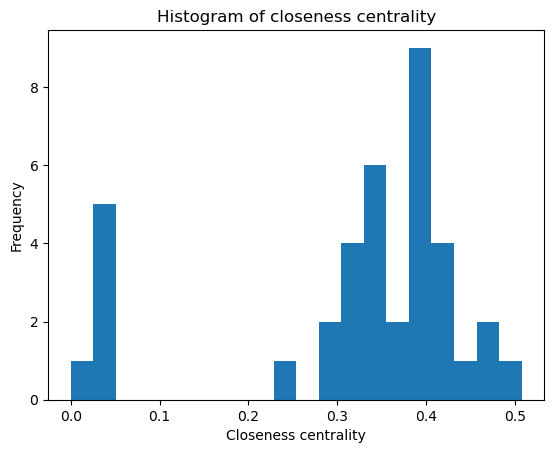

In [345]:
display_closeness_centrality_stats(my_directed_graph)


Here we created a function that takes the eigenvector centrality of a graph and displays some analysis of the result, This will generate the output and plots described above, providing some insights into the importance and centrality of nodes in follower network graph based on eigenvector centrality.

In [346]:
def analyze_eigenvector_centrality(G, figsize=(10, 8)):
    # Calculate eigenvector centrality
    ec = nx.eigenvector_centrality(G)
    
    # Sort nodes by eigenvector centrality and print top 10
    sorted_ec = sorted(ec.items(), key=lambda x: x[1], reverse=True)
    print("Top 10 nodes by eigenvector centrality:")
    for node, score in sorted_ec[:10]:
        print(f"{node}: {score:.4f}")
    
    # Calculate average eigenvector centrality
    avg_ec = sum(ec.values()) / len(ec)
    print(f"Average eigenvector centrality: {avg_ec:.4f}")
    
    # Plot a histogram of eigenvector centrality values
    plt.figure(figsize=figsize)
    plt.hist(list(ec.values()), bins=20)
    plt.title("Histogram of eigenvector centrality")
    plt.xlabel("Eigenvector centrality")
    plt.ylabel("Frequency")
    plt.show()
    



Top 10 nodes by eigenvector centrality:
mashable: 0.3351
techmeme: 0.2874
wired: 0.2769
techcrunch: 0.2662
engadget: 0.2593
thenextweb: 0.2345
huffposttech: 0.2174
gizmodo: 0.2016
cnet: 0.1982
verge: 0.1975
Average eigenvector centrality: 0.1343


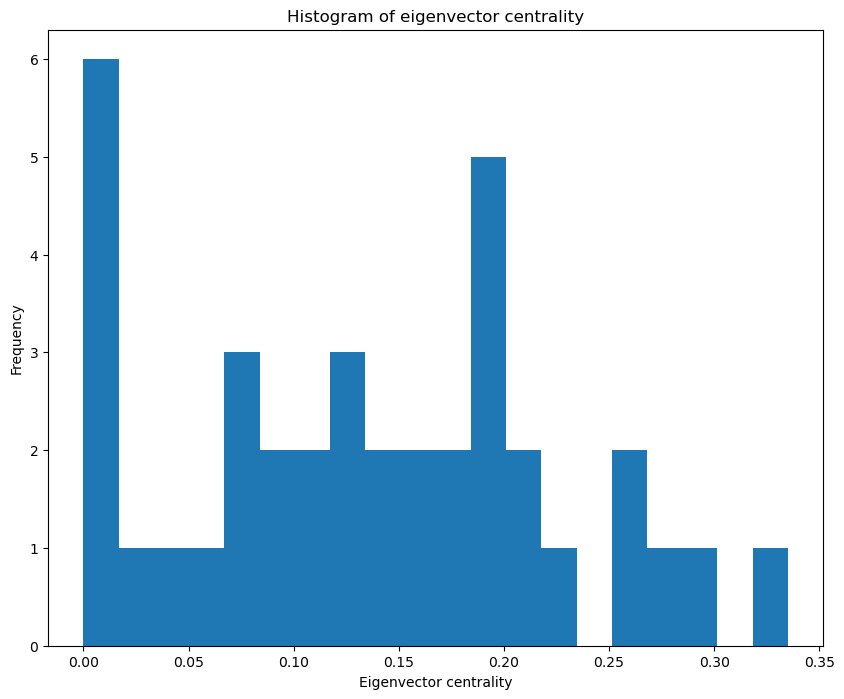

In [347]:
analyze_eigenvector_centrality(my_directed_graph)

We can construct an ego network for mashable and plot the graph 

In [348]:
def display_ego(graph, name):
    #create the ego network
    eg = nx.ego_graph(my_directed_graph,name)
    pos = nx.spring_layout(my_directed_graph, k=2.0)
    
    plt.figure(figsize=(15, 15))
    plt.margins(0.1, 0.1)
    title = "Ego network " , name , eg.number_of_nodes() ,"nodes "
    plt.title(title, fontsize=15)
    
    # draw the full network
    nx.draw_networkx(eg, pos, with_labels=True, font_size=12,node_size=500, node_color='green', edge_color='red')
    
    # draw the ego in a different colour with larger node size
    nx.draw_networkx_nodes(eg, pos, nodelist=[name], node_size=3500, node_color = "yellow")
    plt.axis("off")
    plt.show()
    print("Number of nodes:",round(eg.number_of_nodes()))
    print("Number of edges:",round(eg.number_of_edges()))
    print("Density",round(nx.density(eg),3))
    return eg

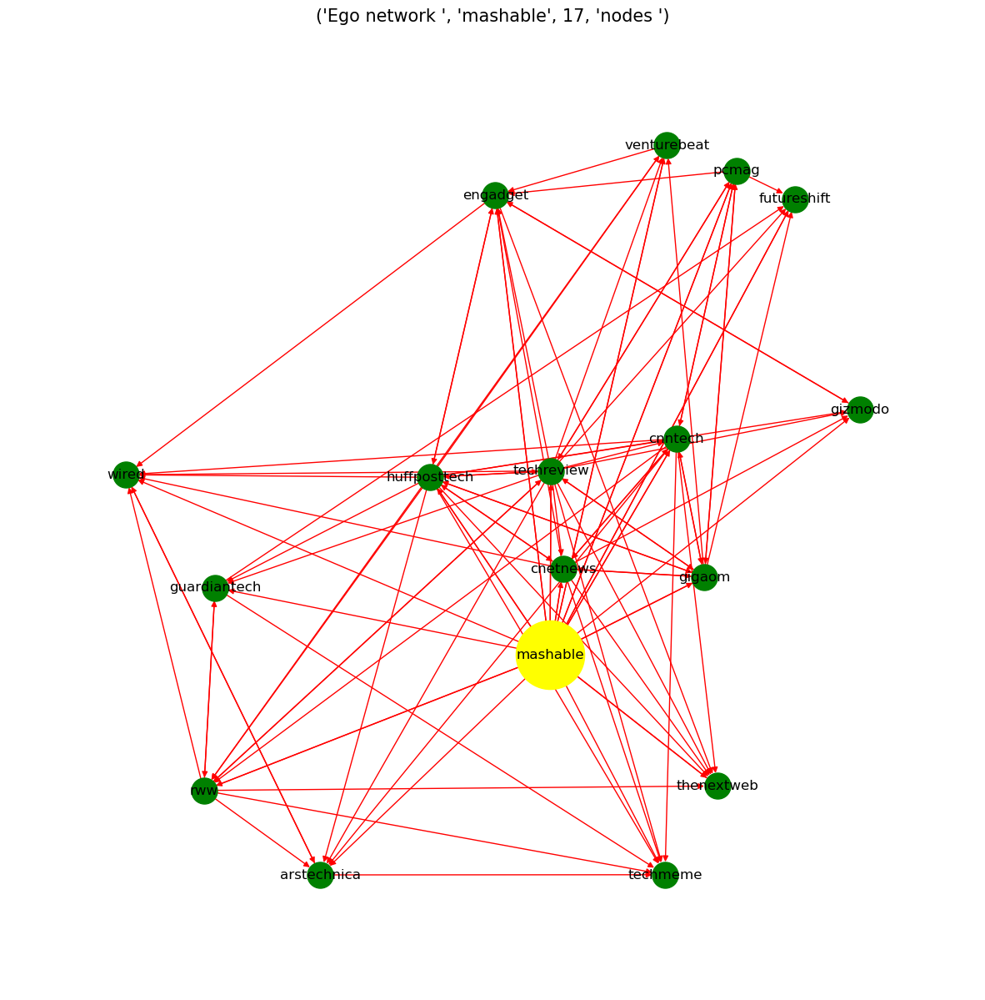

Number of nodes: 17
Number of edges: 102
Density 0.375


In [349]:
display_ego(followerNetwork,"mashable")
plt.show()

We can see That for mashable The number of nodes is 17 amd the number of edges is 102 and The Denisty for mashable is is almost 0.4 

Now we wil ctare a unction that takes a graph and displays some analysis of the clustering coefficient:

In [350]:
def display_clustering_stats(G):
    # Calculate clustering coefficient
    cc = nx.clustering(G)
    # Print top 10 nodes by clustering coefficient
    sorted_cc = sorted(cc.items(), key=lambda x: x[1], reverse=True)
    print("Top 10 nodes by clustering coefficient:")
    for node, score in sorted_cc[:10]:
        print(f"{node}: {score:.4f}")
    # Calculate average clustering coefficient
    avg_cc = sum(cc.values()) / len(cc)
    print(f"Average clustering coefficient: {avg_cc:.4f}")
    # Plot a histogram of clustering coefficient values
    plt.hist(list(cc.values()), bins=20)
    plt.title("Histogram of clustering coefficient")
    plt.xlabel("Clustering coefficient")
    plt.ylabel("Frequency")
    plt.show()


Top 10 nodes by clustering coefficient:
fttechnews: 0.6667
techrepublic: 0.6667
futureshift: 0.6000
venturebeat: 0.5926
thenextweb: 0.5923
gigaom: 0.5546
wsjtech: 0.5476
bitech: 0.5417
guardiantech: 0.5377
pcmag: 0.5233
Average clustering coefficient: 0.3932


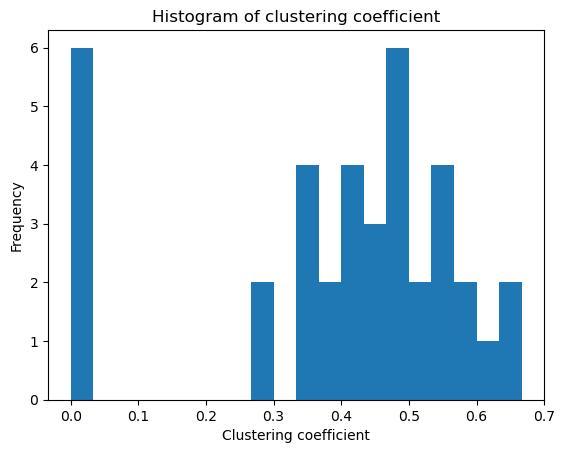

In [351]:
# graph object called my_directed_graph
display_clustering_stats(my_directed_graph)

As you can see That for the top 10 nodes There clustering coefficient is at almost 0.6 so there is a gooed correlation between Them nodes and there average is 0.3932 

Here we created function calculates the density percentage of a given graph and prints out

In [352]:
def density_percentage(graph, sentence):
    # Calculate total number of possible edges
    number = graph.number_of_nodes()
    edges = (number * (number - 1)) / 2
    # Calculate actual number of edges and density
    actual_edges = graph.number_of_edges()
    density = actual_edges / edges
    # Print statement indicating the density of the graph
    print(f"The {sentence} has a density of {round(density * 100, 2)}%.")


In [353]:
density_percentage(my_directed_graph, "follower network graph")


The follower network graph has a density of 37.55%.


Network density refers to the portion of potential edges between nodes in a network that exist as actual edges.

Density is calculated numerically as the ratio of existing edges over the total number of potential edges between all pairs of nodes.

Now we are gonna plot a degree degree disturbution For the Follower network and show the four main components Degree Min, Degree Max, Mean degree,Median degree

In [354]:
# degree disturbution function that calcultes both stats and plotiing in the disturbution
def degree_Disturbution_Function(network,name,color):
    degreeee = pd.Series(dict(nx.degree(network)))
    colour = color

    plt.figure(figsize=(15, 5))
    sns.histplot(data=degreeee, color= colour)
    plt.title(name + " Distrubution",fontsize=18)
    plt.xlabel('Node Degree', fontsize=16)
    plt.ylabel('Frequency', fontsize=16)
    plt.show()

    print('Degree Min:', degreeee.min())
    print('Degree Max:', degreeee.max())
    print('Mean degree:',round(degreeee.mean(),3))
    print('Median degree:',round(degreeee.median(),3))


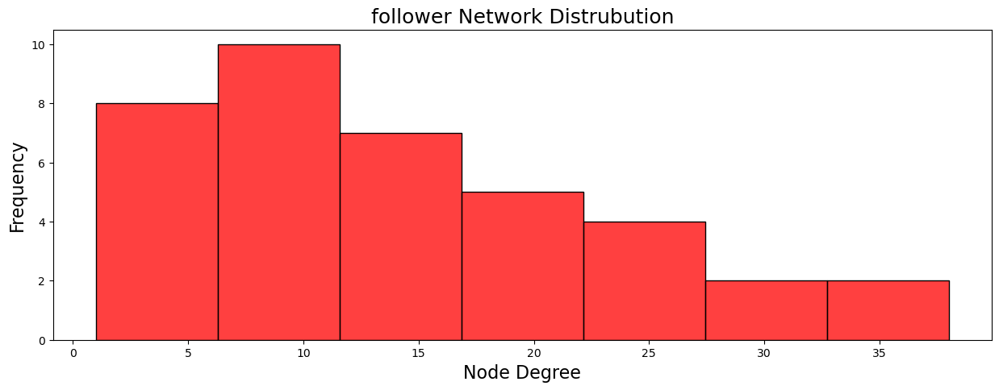

Degree Min: 1
Degree Max: 38
Mean degree: 13.895
Median degree: 12.0


In [355]:
#degree disturbution for the follower network
degree_Disturbution_Function(my_directed_graph,"follower Network","red")

In [356]:
As we can see That That the degree Min is and The max is 38 and the mean of the Degree is almost at 14 But the Median degree is 12.0

SyntaxError: invalid syntax (884928944.py, line 1)

In-degree: count of number of incoming edges for each node.
    
To begin, we can examine the distributions of in-degree centralities - the normalised in-degrees. We can do so by inspecting the probability distribution, where Probability(k) equals the fraction of all nodes in the network with in-degree k.

# In-degree Distribution

In [ ]:
def compute_and_sort_in_degrees(G, weighted=False):
    """
    Compute and sort node in-degrees (optionally weighted) in a directed graph.

    Args:
    - G: a directed graph
    - weighted: a boolean indicating whether to compute weighted in-degrees (default: False)

    Returns:
    - a list of tuples, where each tuple contains a node and its in-degree (and optionally, its weighted in-degree)
    """
    # Compute node in-degrees (optionally weighted)
    if weighted:
        in_degrees = dict(G.in_degree(weight='weight'))
    else:
        in_degrees = dict(G.in_degree())

    # Sort node in-degrees in descending order
    sorted_in_degrees = sorted(in_degrees.items(), key=lambda x: x[1], reverse=True)

    # Print node in-degrees (and optionally, weighted in-degrees)
    if weighted:
        print("Weighted in-degrees:")
    else:
        print("In-degrees:")
    for node, in_degree in sorted_in_degrees:
        print(f"{node}: {in_degree}")

    # Compute and print degree statistics (mean, median, min, max)
    degrees = [d for n, d in in_degrees.items()]
    print("Degree statistics:")
    print(f"Mean degree: {sum(degrees) / len(degrees)}")
    print(f"Median degree: {sorted(degrees)[len(degrees)//2]}")
    print(f"Minimum degree: {min(degrees)}")
    print(f"Maximum degree: {max(degrees)}")

    # Return sorted node in-degrees (and optionally, weighted in-degrees)
    return sorted_in_degrees


In [ ]:
# Compute and sort node in-degrees (and degree statistics)
sorted_in_degrees = compute_and_sort_in_degrees(my_directed_graph)

# Compute and sort node weighted in-degrees (and weighted degree statistics)
sorted_weighted_in_degrees = compute_and_sort_in_degrees(my_directed_graph, weighted=True)


Out-Degree Centrality Distribution

Next we can look at the distribution of the out-degree centralities.

In [ ]:
# Computing the out-degree of each node in the graph
out_degrees = my_directed_graph.out_degree()

# Printing the out-degree of each node
print("Out-degree for each node:")
for node, degree in out_degrees:
    print(f"{node}: {degree}")


# Followers Ranking

parsing the user profile JSON lines in the file list members.jsonl and ranking users based on the number of followers

In [ ]:
with open('list_members.jsonl') as f:
    Rank_Listz = pd.DataFrame([json.loads(line.strip()) for line in f])

f'Rows: {len(Rank_Listz)}', Rank_Listz.columns

In [ ]:
Rank_Listz['screen_name'] = Rank_Listz['screen_name'].str.lower()

plt.figure(figsize=(15, 8))
sns.barplot(data=Rank_Listz[['screen_name', 'followers_count']].
            sort_values(by='followers_count',
                        ascending=False),
            x='followers_count',
            y='screen_name',
            color='#2e86c9')
plt.title('Followers Count Ranking', fontsize=16)
plt.ylabel(None)
plt.xlabel('Number of followers', fontsize=14)
plt.tick_params(labelsize=12)
plt.show()

As we can See there's Major difrences in the top 3 nodes Whick are TechCrunch, Wired, mashable. Than the rest of the nodes didn't even surpassed the 0.4 We can see that major difrences can happen beteween them

In [357]:
This is How the graph Looks like hows in terms of visulazition. 

SyntaxError: invalid syntax (241374360.py, line 1)

The mutual graph has 38 nodes and 47 edges
Density of Mutual network: 0.06685633001422475


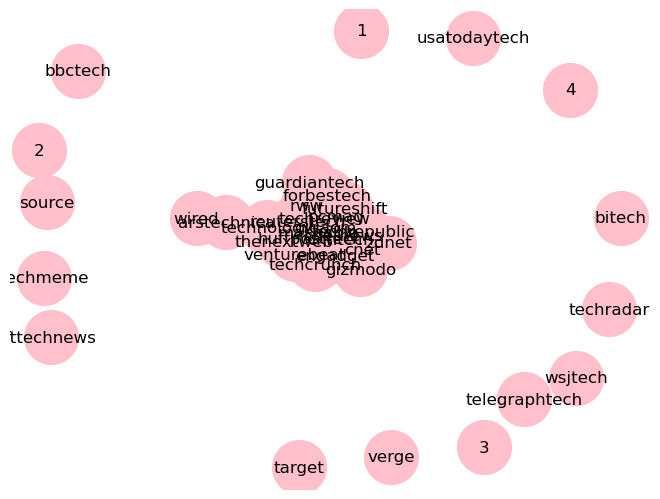

In [358]:
# changing it to undirected and making the reciprocal to true
mutual = my_directed_graph.to_undirected(reciprocal=True)
# drawing the mutual network to undirected
nx.draw_spring(mutual, with_labels=True, node_color='pink', node_size=1500, edge_color='black')
# printing the mutual graph that how many nodes it has anfd how many edges it has 
print(f"The mutual graph has {mutual.number_of_nodes()} nodes and {mutual.number_of_edges()} edges")
# printing the density of the mutual network 
print(f"Density of Mutual network: {nx.density(mutual)}")

Follower Network into undirected to see how many nodes and edges there are and how the graph looks in terms of visualization.

As we can see That the the mutual graph has 38 nodes and 47 edgesDensity of Mutual network: 0.06685633001422475.

# Task 2: Reply network

A reply network is a weighted, directed network for a collection of tweets, where each node represents a Twitter account and an edge from user X to user Y represents that X has replied to Y, with the edge weight representing the number of such replies.

Here we will work on the Reply network, we must parse the JSON lines file containing all the collected tweets. 

In [359]:
with open('tweets.jsonl') as f:
    tweets_df = pd.DataFrame(json.loads(line.strip()) for line in f)

f'Rows: {len(tweets_df)}', tweets_df.columns

('Rows: 27150',
 Index(['created_at', 'id', 'id_str', 'full_text', 'truncated',
        'display_text_range', 'entities', 'source', 'in_reply_to_status_id',
        'in_reply_to_status_id_str', 'in_reply_to_user_id',
        'in_reply_to_user_id_str', 'in_reply_to_screen_name', 'user', 'geo',
        'coordinates', 'place', 'contributors', 'is_quote_status',
        'retweet_count', 'favorite_count', 'favorited', 'retweeted',
        'possibly_sensitive', 'lang', 'extended_entities', 'retweeted_status',
        'quoted_status_id', 'quoted_status_id_str', 'quoted_status_permalink',
        'quoted_status'],
       dtype='object'))

As we can see Theres is 27150 Tweets in this json files 

In [191]:
Reply_Netz = tweets_df[['user', 'in_reply_to_screen_name']].copy()
Reply_Netz = Reply_Netz[Reply_Netz['in_reply_to_screen_name'].notnull()]
Reply_Netz['in_reply_to_screen_name'] = Reply_Netz['in_reply_to_screen_name'].str.lower()

Reply_Netz['user'] = Reply_Netz['user'].apply(lambda u: u['screen_name'].lower())
Reply_Netz.head(10)

,user,in_reply_to_screen_name
1,techcrunch,techcrunch
7,techreview,techreview
175,wired,wired
218,bitech,bitech
233,wired,wired
301,wired,wired
368,thenextweb,thenextweb
490,techcrunch,techcrunch
555,forbestech,forbestech
604,thenextweb,thenextweb


Now what we gonna do is extracting  relevant pair of columns for a reply network  filtering step is applied to obtain only the tweets which are indeed replies

Now we only get tweets that are actually replies. For convenience, screen names are converted to lowercase.

In [192]:
Reply_Netz = pd.DataFrame(Reply_Netz.value_counts(), columns=['num_replies'])
Reply_Netz.reset_index(inplace=True)
Reply_Netz.head(10)

,user,in_reply_to_screen_name,num_replies
0,thenextweb,thenextweb,198
1,bitech,bitech,79
2,wired,wired,73
3,techcrunch,techcrunch,69
4,telegraphtech,telegraphtech,38
5,techreview,techreview,12
6,venturebeat,nvidia,10
7,venturebeat,jobbio,8
8,verge,verge,8
9,cnntech,cnntech,7


The next major step is to group and count the identical pairs in order to calculate the quantity of responses for each ordered pair.

In [193]:
Reply_Netz = nx.from_pandas_edgelist(Reply_Netz, source='user', target='in_reply_to_screen_name',
                                    edge_attr='num_replies', create_using=nx.DiGraph)

# compute network characteristics

In [194]:
# printing the number of nodes and edges below the graph
print("Number of nodes:",Reply_Netz.number_of_nodes())
print("Number of edges:",Reply_Netz.number_of_edges())

Number of nodes: 150
Number of edges: 146


As we can see There is 150 nodes and 146 edges In this Reply Network

In [195]:
# printing the results of the reply network
print(f"Density of Follower Network: {nx.density(Reply_Netz)}")

Density of Follower Network: 0.006532438478747204


Here we printed The denisty of the netwrok

In [196]:
# printing the results of the reply network
print(f"Is the graph directed?:{nx.is_directed(Reply_Netz)}")
print(f"Is the graph strongly connected?:{nx.is_strongly_connected(Reply_Netz)}")

Is the graph directed?:True
Is the graph strongly connected?:False


printing to check if the graph is directed in th reply network and if it strongly connected , we can see that the graph is directed but it is not strongly connected.

# Degree Disterbuition For Reply Netz

 we can plot their respective overall distributions.

In [265]:
#diplaying the degree of in_degree and defining them of both in degree and out degree
in_degree = pd.Series(dict(Reply_Netz.in_degree()), name='In-Degree')
out_degree = pd.Series(dict(Reply_Netz.out_degree()), name='Out-Degree')
DataFrame_First = pd.DataFrame(in_degree)
DataFrame_Second = pd.DataFrame(out_degree)
degree_data_1 = pd.DataFrame(df1).sort_values(by='In-Degree', ascending=False)
display(degree_data_1)

,In-Degree
thenextweb,1
appenglobal,1
alvindotai,1
altana_ai,1
alation,1
1password,1
techradar,1
windowscentral,1
technology,1
mavenclinic,1


The vast majority of accounts in the network have an in-degree of one, and some have none. This means that in the given network, the majority of accounts receive responses from no more than one account.

In [198]:
#diplaying the degree of out_degree here
degree_data_2 = pd.DataFrame(df2).sort_values(by='Out-Degree', ascending=False)
display(degree_data_2)

,Out-Degree
venturebeat,114
gigaom,6
wired,5
technology,3
techcrunch,2
techradar,2
thenextweb,1
reuterstech,1
engadget,1
forbestech,1


As we cann that for the out degree is a bit diffrenet we 6 of them which are more than one 

In [199]:
# ccombining in_degre and out_degree columns displaying the ratio of the reply network
dataframe = pd.concat([in_degree, out_degree], axis=1)
dataframe['Ratio'] = dataframe['In-Degree']/dataframe['Out-Degree']

Ratio = pd.DataFrame(dataframe).sort_values(by='Ratio', ascending=False)
Ratio

,In-Degree,Out-Degree,Ratio
snorkelai,1,0,inf
alation,1,0,inf
alvindotai,1,0,inf
amberatherton,1,0,inf
appenglobal,1,0,inf
appian,1,0,inf
apple,1,0,inf
arizeai,1,0,inf
arta_finance,1,0,inf
baycjoker,1,0,inf


In [200]:
# adding tables together as a dataframe 
First_Data = degree_centrality(Reply_Netz)
First_Data
Second_Data = betweeness_centrality(Reply_Netz)
Second_Data
Third_Data = closeness_centrality(Reply_Netz)
Third_Data 
Fourth_Data = Eigen_Vector_centrality(Reply_Netz)
Fourth_Data
# concating them here
dataframe = pd.concat([First_Data, Second_Data,Third_Data],axis = 1)
# printing the results of the dataframe
dataframe

,degree_Centrality,Betweeness_Centrality,Closeness_Centrality
venturebeat,0.765101,0.0,0.000000
wired,0.040268,0.0,0.000000
gigaom,0.040268,0.0,0.000000
technology,0.026846,0.0,0.000000
techcrunch,0.020134,0.0,0.000000
techradar,0.020134,0.0,0.000000
thenextweb,0.013423,0.0,0.000000
usatodaytech,0.013423,0.0,0.000000
engadget,0.013423,0.0,0.000000
forbestech,0.013423,0.0,0.000000


Now we will Check Rhe corrilation between them 

In [201]:
# calculating the correlationn between them
dataframe.corr()

,degree_Centrality,Betweeness_Centrality,Closeness_Centrality
degree_Centrality,1.000000,NaN,-0.262159
Betweeness_Centrality,NaN,NaN,NaN
Closeness_Centrality,-0.262159,NaN,1.000000


The correlation indicating a moderate positive relationship.

Plot HeatMap 

<AxesSubplot:>

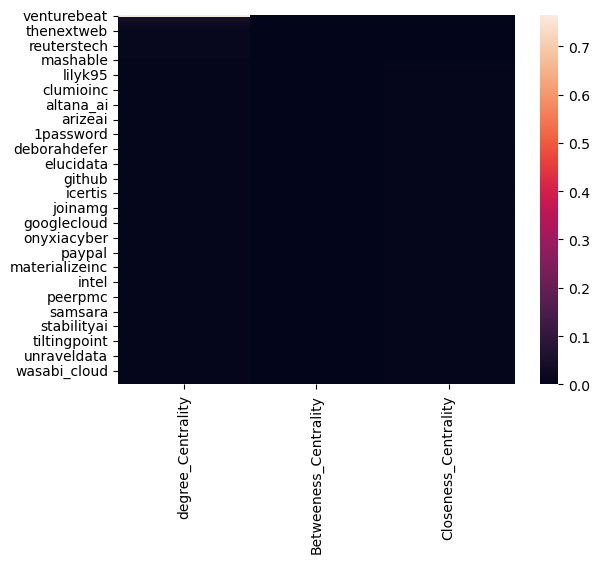

In [202]:
sns.heatmap(dataframe)

measures is illustrated using a heatmap.

In [203]:
#eigen vector centrality it doesnt work since it too big 
long_eigen_vector = nx.pagerank(Reply_Netz, max_iter=600)
long_eigen_vector

{'thenextweb': 0.02940295109160006,
 'bitech': 0.02940295109160006,
 'wired': 0.005319948076319026,
 'techcrunch': 0.007679809126174472,
 'telegraphtech': 0.02940295109160006,
 'techreview': 0.02940295109160006,
 'venturebeat': 0.004415454673045488,
 'nvidia': 0.004448380438126354,
 'jobbio': 0.004448380438126354,
 'verge': 0.02940295109160006,
 'cnntech': 0.02940295109160006,
 'microsoft': 0.004448380438126354,
 'googlecloud': 0.004448380438126354,
 'usatodaytech': 0.02940295109160006,
 'meta': 0.004448380438126354,
 'reuterstech': 0.02940295109160006,
 'oracle': 0.004448380438126354,
 'peerpmc': 0.004448380438126354,
 'creatio_global': 0.004448380438126354,
 'google': 0.004448380438126354,
 'aksaigal': 0.004448380438126354,
 'snowflakedb': 0.004448380438126354,
 'bbctech': 0.02940295109160006,
 'intel': 0.004448380438126354,
 'newrelic': 0.004448380438126354,
 'gigaom': 0.004415454673045488,
 'pluralsight': 0.005041044209581931,
 'ocient': 0.004448380438126354,
 'paloaltontwks': 0.00

Now we will create an egon graph for cnet

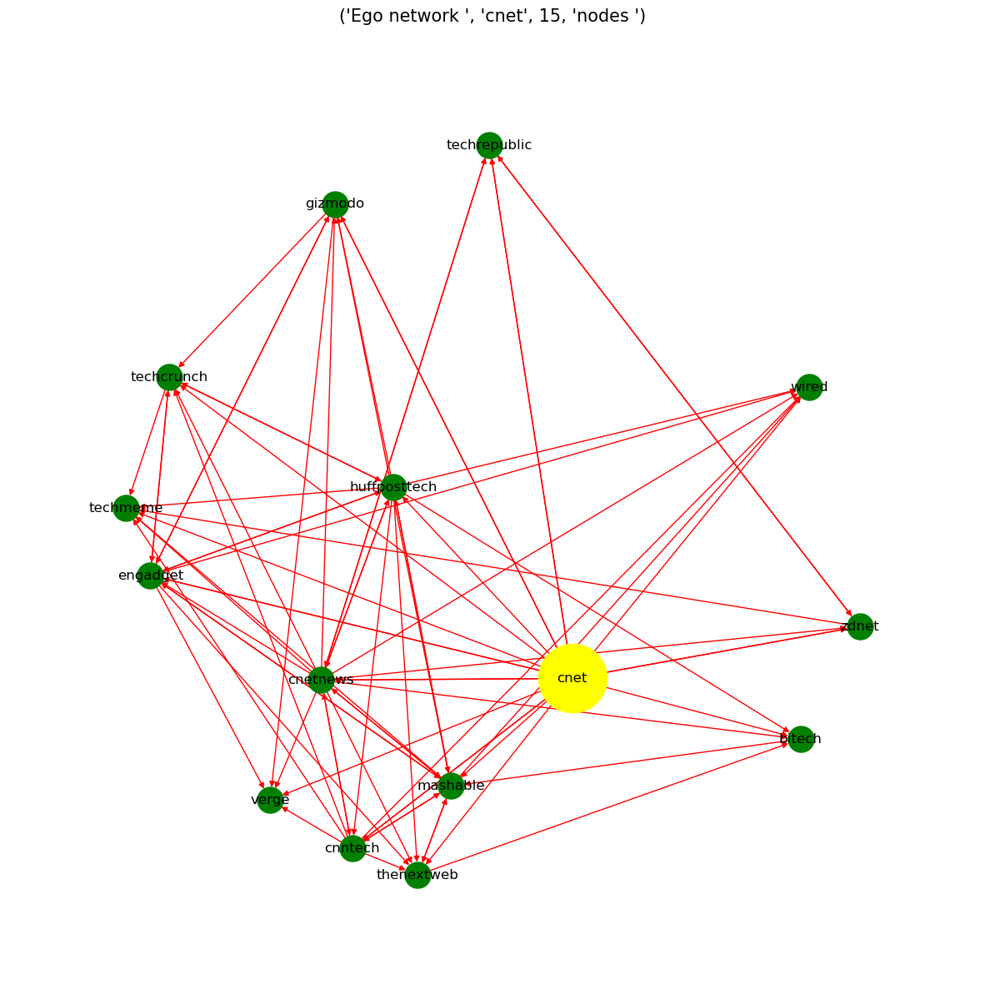

Number of nodes: 15
Number of edges: 78
Density 0.371


In [204]:
# calling the function of the reply network of 
display_ego(Reply_Netz,"cnet")
plt.show()

As we can see For this ego Network The number of nodes is 15 and The number of edges is 78 and The Denisty is 0.371

Now we will create an egon graph for mashable

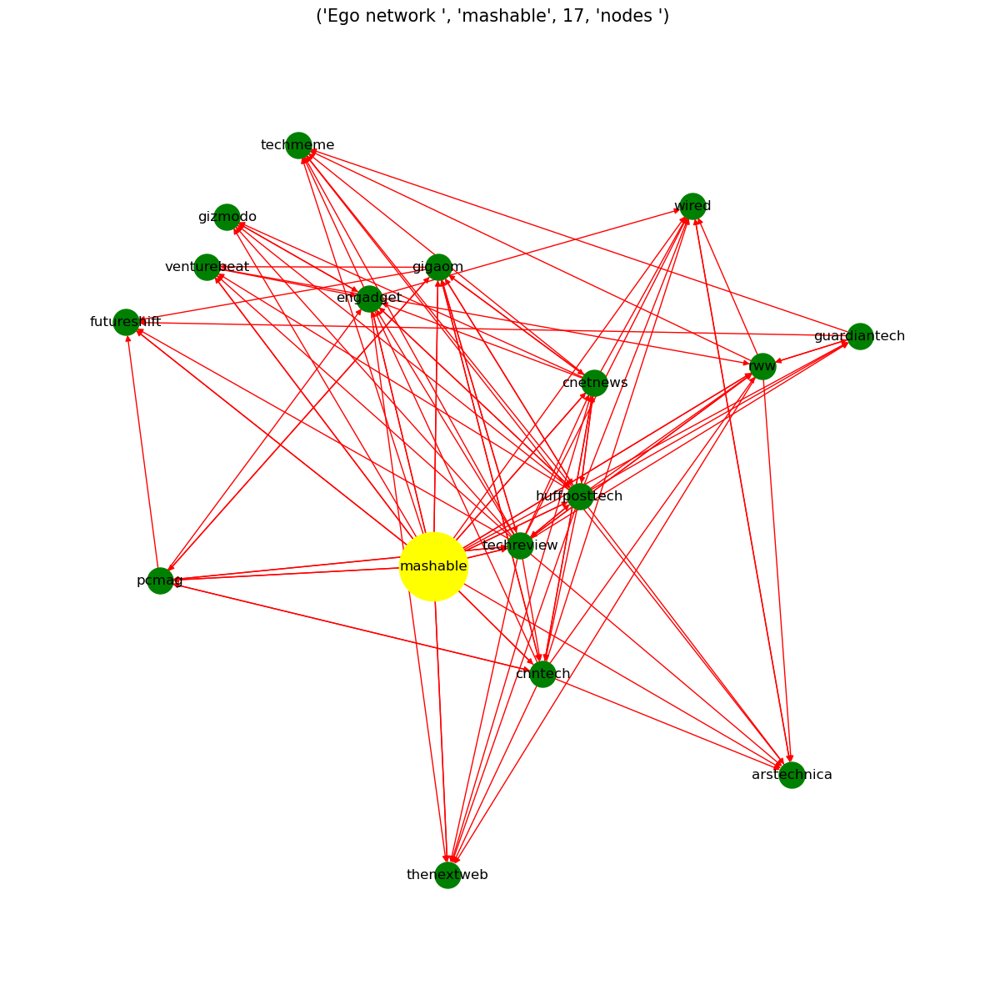

Number of nodes: 17
Number of edges: 102
Density 0.375


In [205]:
# calling the function of the reply network of hotspur
display_ego(Reply_Netz,"mashable")
plt.show()

Now we will do Network visualsation for the Reply Network to show it's overall and we can do that by using Networkx itself 

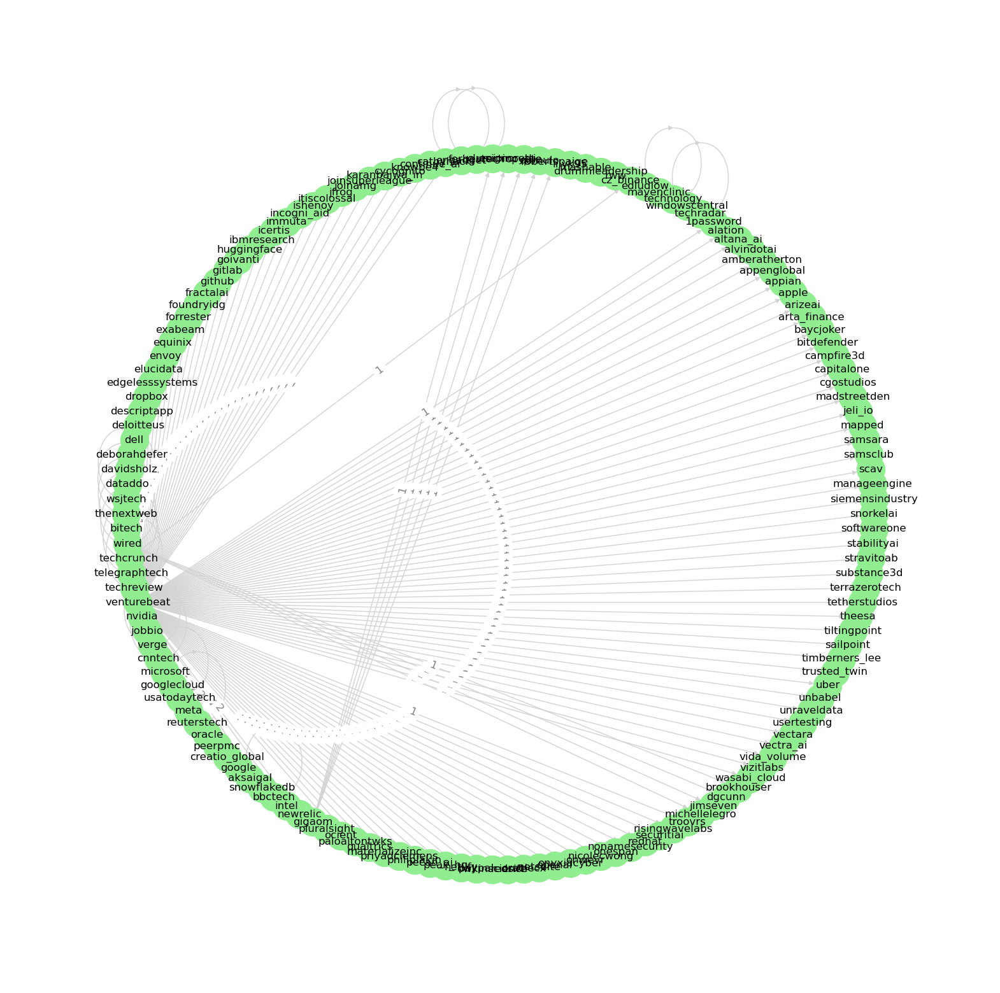

In [206]:
plt.figure(figsize=(20, 20))
plt.margins(0.1, 0.1)
pos = nx.shell_layout(Reply_Netz)
labels = nx.get_edge_attributes(Reply_Netz, 'num_replies')

nx.draw_networkx(Reply_Netz, pos, font_size=12, node_size=1000,
                 node_color='lightgreen', edge_color='lightgrey')
nx.draw_networkx_edge_labels(
    Reply_Netz, pos, edge_labels=labels, font_size=12, font_color='grey')
plt.axis('off')
plt.show()

# Task 3:Mention network

The relevant columns are copied from the entire tweets DataFrame. The list of mentioned screen names is extracted, and tweets with no mentions are removed. The screen names of the tweet authors and mentioned users are converted to lowercase.

In [307]:
Mention_Netz = tweets_df[['user', 'entities']].copy()

Mention_Netz['user_mentions'] = Mention_Netz['entities'].apply(
    lambda e: e['user_mentions'])

Mention_Netz.drop(['entities'], axis=1, inplace=True)
Mention_Netz = Mention_Netz[Mention_Netz['user_mentions'].map(len) != 0]

Mention_Netz['user_mentions'] = Mention_Netz['user_mentions'].apply(
    lambda x: [u['screen_name'].lower() for u in x])

Mention_Netz['user'] = Mention_Netz['user'].apply(
    lambda u: u['screen_name'].lower())

Mention_Netz

,user,user_mentions
2,zdnet,[sabrinaa_ortiz]
3,gigaom,[mazoff]
6,techcrunch,[kyle_l_wiggers]
15,rww,[theverge]
30,techrepublic,"[ramonaeid, techrepublic]"
41,techcrunch,[rebeccabellan]
45,techcrunch,[christinemhall]
47,techrepublic,"[mazherhashmi, techrepublic, forrester, charle..."
49,technology,"[emilychangtv, serenawilliams]"
55,wired,"[pocket, adriennemso]"


The frequency of all the unique tweet author - mentioned user pairs is computed, yielding the network's required edge weights.

In [308]:
Mention_Netz = Mention_Netz.explode('user_mentions')
Mention_Netz = pd.DataFrame(Mention_Netz.value_counts(), columns=['num_mentions'])
Mention_Netz.reset_index(inplace=True)
Mention_Netz.head(10)

,user,user_mentions,num_mentions
0,gizmodo,gizmodo,425
1,telegraphtech,telebusiness,424
2,gigaom,gigaom,136
3,gigaom,esignoretti,115
4,techrepublic,techrepublic,103
5,bitech,businessinsider,88
6,gigaom,dspark,71
7,thenextweb,jobbio,59
8,gigaom,andrewbrust,54
9,techcrunch,kyle_l_wiggers,47


Usint The edgelist To create a weighted netwrok and directed network.

In [209]:
Mention_Netz2 = nx.from_pandas_edgelist(Mention_Netz, source='user', target='user_mentions',
                                      edge_attr='num_mentions', create_using=nx.DiGraph)

Now im gonna print the number of nodes and edges for Mention_Netz2 Network

In [210]:
# printing the number of nodes and edges below the graph
print("Number of nodes:",Mention_Netz2.number_of_nodes())
print("Number of edges:",Mention_Netz2.number_of_edges())

Number of nodes: 2182
Number of edges: 2340


Now printing the Dinesty For Mention_Netz2 Network

In [211]:
# printing the results of the reply network
print(f"Density of Follower Network: {nx.density(Mention_Netz2)}")

Density of Follower Network: 0.0004917059295952756


Now Checking if the grapgh is directed and if so is it strongly connected 

In [212]:
# printing the results of the reply network
print(f"Is the graph directed?:{nx.is_directed(Mention_Netz2)}")
print(f"Is the graph strongly connected?:{nx.is_strongly_connected(Mention_Netz2)}")

Is the graph directed?:True
Is the graph strongly connected?:False


In [213]:
print("Reciprocity %.2f" % nx.reciprocity(Mention_Netz2) )


Reciprocity 0.00


Now printing the Average Clustering Coefficient F~or the Mention_Netz2 Network

In [214]:
print("Follower Network Average Clustering Coefficient: ", round(nx.average_clustering(Mention_Netz2), 3))


Follower Network Average Clustering Coefficient:  0.007


# Degree Distributions

 show the users who often mention other Twitter accounts, and those who are most frequently mentioned.

In [261]:
# taking the  weight with in degree and sorting from the highest to the lowest
in_deg = pd.Series(dict(Mention_Netz2.in_degree(weight="weight") ), name="with-in-degree")
pd.DataFrame(in_deg).sort_values(by="with-in-degree", ascending=False).head(10)

,with-in-degree
elonmusk,7
microsoft,6
google,5
airbnb,4
wired,4
amazon,4
snowflakedb,3
torii_hq,3
netflix,3
nasa,3


In [266]:
#diplaying the degree of in_degree and defining them of both in degree and out degree
in_degree = pd.Series(dict(Mention_Netz2.in_degree()), name='In-Degree')
out_degree = pd.Series(dict(Mention_Netz2.out_degree()), name='Out-Degree')
DataFrame_First = pd.DataFrame(in_degree)
DataFrame_Second = pd.DataFrame(out_degree)
degree_data_1 = pd.DataFrame(df1).sort_values(by='In-Degree', ascending=False)
display(degree_data_1)

,In-Degree
thenextweb,1
appenglobal,1
alvindotai,1
altana_ai,1
alation,1
1password,1
techradar,1
windowscentral,1
technology,1
mavenclinic,1


In [267]:
##diplaying the degree of out_degree here
degree_data_2 = pd.DataFrame(DataFrame_Second).sort_values(by='Out-Degree', ascending=False)
display(degree_data_2)

,Out-Degree
gigaom,498
techmeme,421
venturebeat,289
bitech,154
techrepublic,138
technology,115
techcrunch,105
telegraphtech,103
wired,92
techreview,70


Printing the directed mention network as a graph 

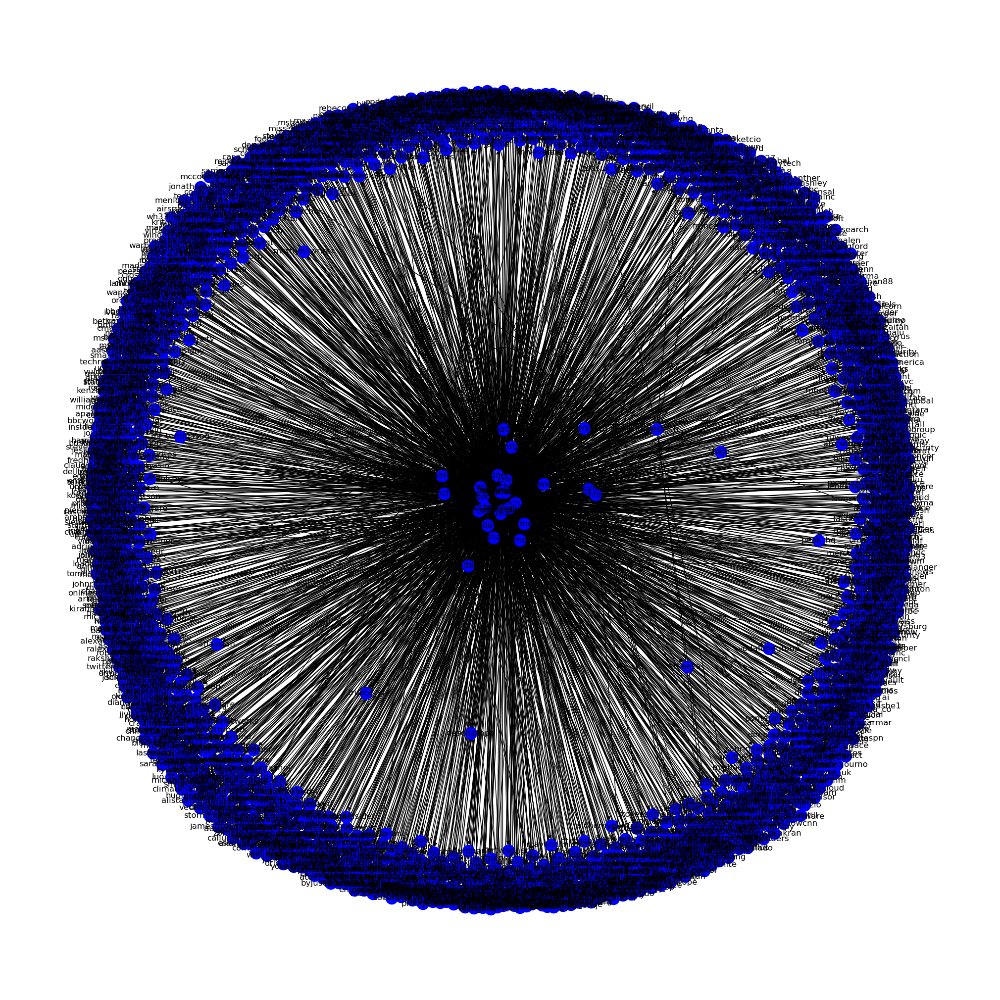

In [280]:
# displaying the graph of the mention network
graph = Mention_Netz2
plt.figure(figsize=(20,20))
nx.draw_spring(graph, with_labels=True, node_size=300, node_color="blue",edge_color="black")
plt.axis("off")
# showing the graph
plt.show()

Now im gonnna Show the number od nodes and edges for Mention_Netz2

In [282]:
# calling the function
NetworkNodesAndEdges(Mention_Netz2)


Number of nodes: 2182
Number of edges: 2340


In [283]:
# printing
print("Density of mention network: ", nx.density(Mention_Netz2))
print("Is mention network directed?: ", nx.is_directed(Mention_Netz2))

Density of mention network:  0.0004917059295952756
Is mention network directed?:  True


Now im printing the degree_Disturbution_Function for Mention Network

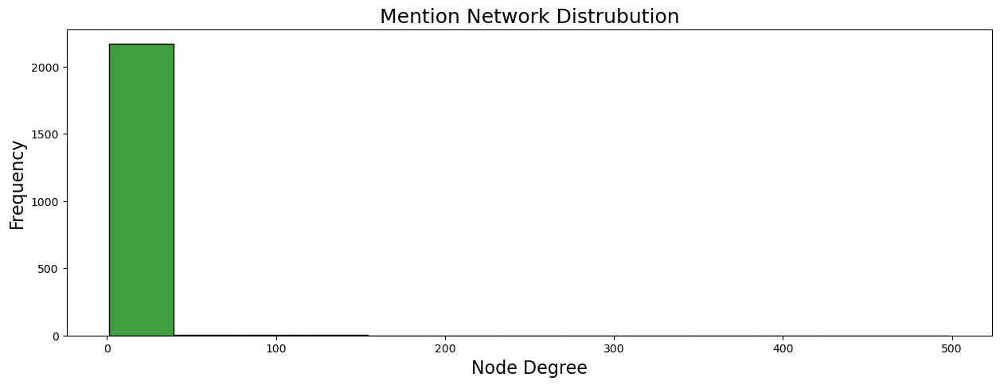

Degree Min: 1
Degree Max: 499
Mean degree: 2.145
Median degree: 1.0


In [284]:
# disturnution function for the mention network 
degree_Disturbution_Function(Mention_Netz2,"Mention Network","green")

In [285]:
# calling the function for the mention network
First_Data = degree_centrality(Mention_Netz2)
First_Data

,degree_Centrality
gigaom,0.228794
techmeme,0.193031
venturebeat,0.133884
bitech,0.071068
techrepublic,0.063732
technology,0.053187
techcrunch,0.049060
telegraphtech,0.047685
wired,0.044017
techreview,0.032554


In [286]:
Second_Data = betweeness_centrality(Mention_Netz2)
Second_Data

,Betweeness_Centrality
venturebeat,0.000115
wired,0.000067
techcrunch,0.000021
arstechnica,0.000016
engadget,0.000004
mashable,0.000003
gizmodo,0.000003
itproportal,0.000000
hgtv,0.000000
0x_bae,0.000000


In [287]:
# calling the function for the mention network
Third_Data =closeness_centrality(Mention_Netz2)
Third_Data

,Closeness_Centrality
elonmusk,0.003260
microsoft,0.002808
google,0.002358
amazon,0.001910
airbnb,0.001910
nasa,0.001834
apple,0.001638
twitter,0.001638
deloitte,0.001638
netflix,0.001638


Now we will get the Dinesty for this network 

In [288]:
#calling functions fro the mention network
Density_Percentage(Mention_Netz2,"Mention Network")


the Mention Network has a density of 0.1 %


Now We will get the average clustering coefficient

In [289]:
Cluster(Mention_Netz2,"Mention Network")

The nodes Mention Network have and average clustering coefficient of 0.007


Now we will get the The number of times a user been mentiuoned in the network and displaying the top 25

In [290]:
# putting the mention network in dictionary as series and storing it to dataframe
Top25 = pd.Series(dict(Mention_Netz2.out_degree()), name='Number Users Mentioned')
pd.DataFrame(Top25).sort_values(by='Number Users Mentioned', ascending=False).head(25)

,Number Users Mentioned
gigaom,498
techmeme,421
venturebeat,289
bitech,154
techrepublic,138
technology,115
techcrunch,105
telegraphtech,103
wired,92
techreview,70


 number of times mentioned and storign the series of the in degree descending 

In [291]:
# putting the mention network in dictionary as series and storing it to dataframe
Top25 = pd.Series(dict(Mention_Netz2.in_degree()), name='Number Times Mentioned')
pd.DataFrame(Top25).sort_values(by='Number Times Mentioned', ascending=False).head(11)

,Number Times Mentioned
elonmusk,7
microsoft,6
google,5
airbnb,4
wired,4
amazon,4
snowflakedb,3
torii_hq,3
netflix,3
nasa,3


Now Display all The data Together So make it easier to see the Data and compare them in the DataFrame 

In [292]:
# adding tables together as a dataframe 
dataframe = pd.concat([First_Data, Second_Data,Third_Data],axis = 1)
dataframe

,degree_Centrality,Betweeness_Centrality,Closeness_Centrality
gigaom,0.228794,0.000000,0.000000
techmeme,0.193031,0.000000,0.000000
venturebeat,0.133884,0.000115,0.000917
bitech,0.071068,0.000000,0.000000
techrepublic,0.063732,0.000000,0.000000
technology,0.053187,0.000000,0.000000
techcrunch,0.049060,0.000021,0.000459
telegraphtech,0.047685,0.000000,0.000000
wired,0.044017,0.000067,0.001376
techreview,0.032554,0.000000,0.000000


In [ ]:
No we plot the correlation and see the semalarities Betwwen them 

In [293]:
dataframe.corr()

,degree_Centrality,Betweeness_Centrality,Closeness_Centrality
degree_Centrality,1.000000,0.401006,-0.08417
Betweeness_Centrality,0.401006,1.000000,0.06460
Closeness_Centrality,-0.084170,0.064600,1.00000


Now we will plot a heatmap Because This the best for correlations visualazation 

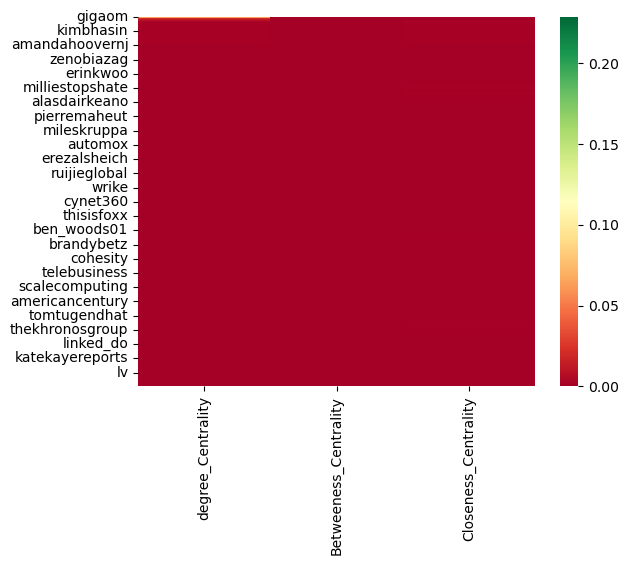

In [298]:
sns.heatmap(dataframe,cmap='RdYlGn')

# Display the Pharma Sector Heatmap
plt.show()

Now im gonna Plot an Ego Network for the venturebeat

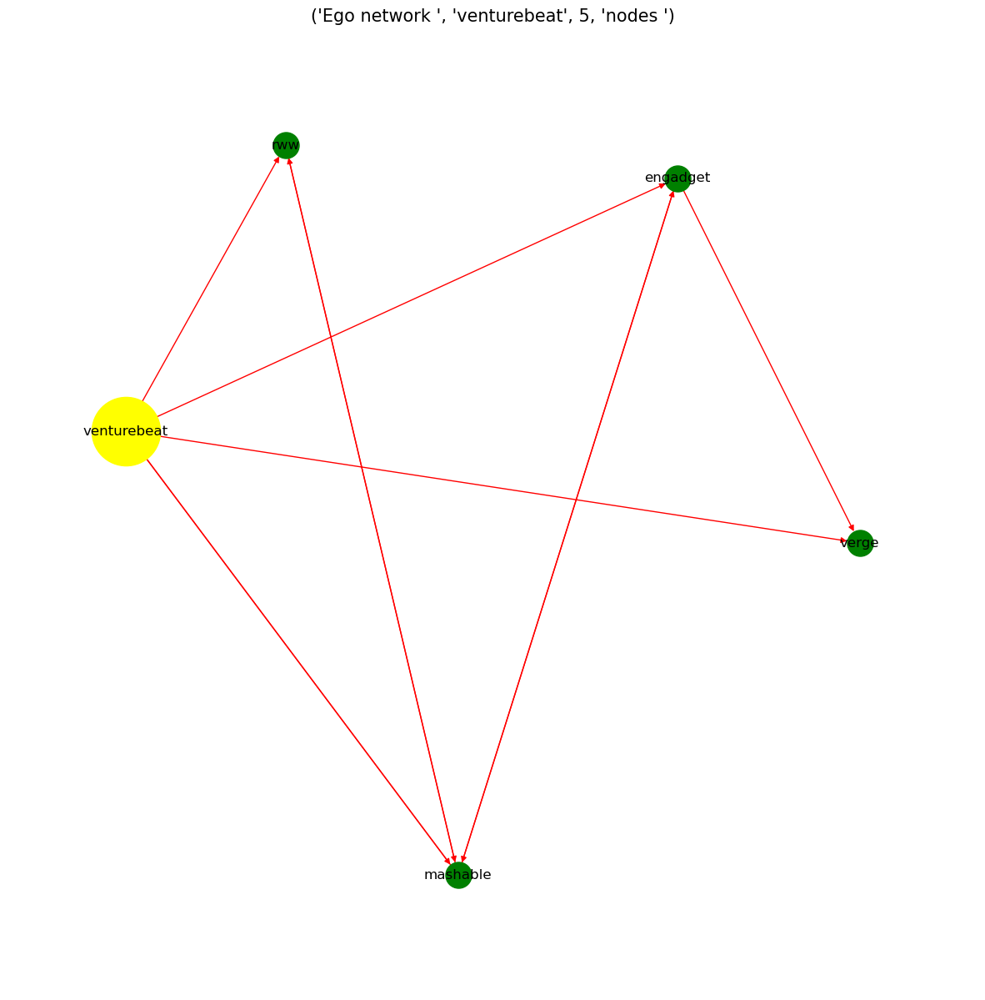

Number of nodes: 5
Number of edges: 10
Density 0.5


In [309]:
ego_ment_Netz2 = display_ego(Mention_Netz2, 'venturebeat')

Now im gonna plot an ego for techcrunch

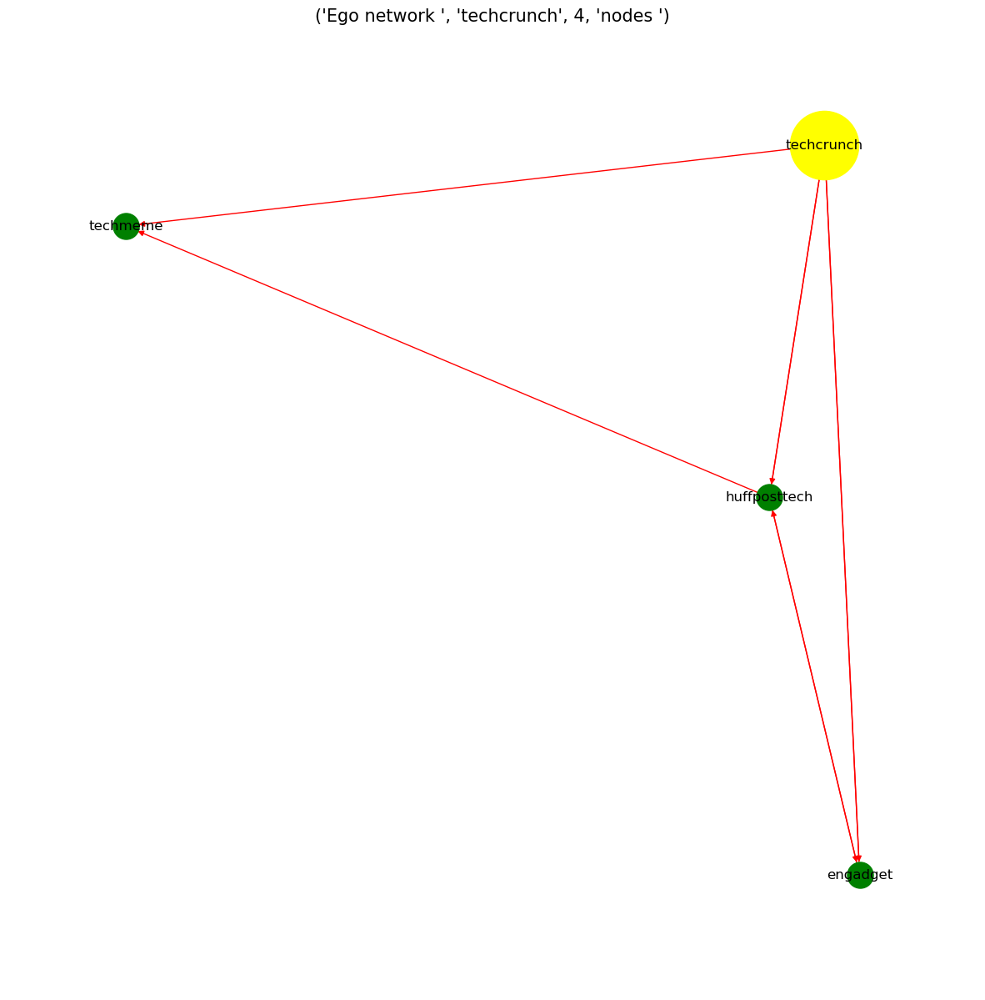

Number of nodes: 4
Number of edges: 8
Density 0.667


In [310]:
ego_ment_Netz2 = display_ego(Mention_Netz2, 'techcrunch')

# Task 4: User-hashtag network

Hashtags are stored in the "entities" column of the tweets data frame.

In [219]:
store_Netz = []
##forming tuples of the user and a unique hashtag that theyve used.
for i, row in tweets_df.iterrows():
    if  len(row["entities"]["hashtags"]) > 0:
        for j in range(0,len(row["entities"]["hashtags"])):
            for k in row["entities"]["hashtags"][j]:
                store_Netz.append((row["user"]["screen_name"], "#{}".format((row["entities"]["hashtags"][j]["text"]).lower())))

In [220]:
store_Netz

[('gigaom', '#ai'),
 ('gigaom', '#ai'),
 ('gigaom', '#ml'),
 ('gigaom', '#ml'),
 ('gigaom', '#edge'),
 ('gigaom', '#edge'),
 ('gigaom', '#edgecomputing'),
 ('gigaom', '#edgecomputing'),
 ('RWW', '#google'),
 ('RWW', '#google'),
 ('RWW', '#tech'),
 ('RWW', '#tech'),
 ('TechRepublic', '#technews'),
 ('TechRepublic', '#technews'),
 ('TechRepublic', '#technology'),
 ('TechRepublic', '#technology'),
 ('RWW', '#tech'),
 ('RWW', '#tech'),
 ('technology', '#winning'),
 ('technology', '#winning'),
 ('VentureBeat', '#ai'),
 ('VentureBeat', '#ai'),
 ('cnntech', '#apple'),
 ('cnntech', '#apple'),
 ('RWW', '#business'),
 ('RWW', '#business'),
 ('mashable', '#futureblink'),
 ('mashable', '#futureblink'),
 ('WIRED', '#cop27'),
 ('WIRED', '#cop27'),
 ('RWW', '#security'),
 ('RWW', '#security'),
 ('VentureBeat', '#cyberthreats'),
 ('VentureBeat', '#cyberthreats'),
 ('VentureBeat', '#cybersecurity'),
 ('VentureBeat', '#cybersecurity'),
 ('RWW', '#tech'),
 ('RWW', '#tech'),
 ('RWW', '#education'),
 ('RWW

In [221]:
# Create the bipartite network
Graph_Netz = nx.Graph()
u_nodes, h_nodes = set(), set()
for p in store_Netz:
    u = p[0]
    h = p[1] 
     # create the nodes, users and hashtags
    if not u in u_nodes:
        Graph_Netz.add_node(u, bipartite=0)
        u_nodes.add(u)
    if not h in h_nodes:
        Graph_Netz.add_node(h, bipartite=1)
        h_nodes.add(h)
         # create the edge 
    h_nodes.add(h)
    Graph_Netz.add_edge( u, h )

In [222]:
 # creating the nodes of biparte to see how many is there in both nodes and edges
print("Created bipartite network with %d nodes and %d edges" % ( Graph_Netz.number_of_nodes(), Graph_Netz.number_of_edges() ) )

Created bipartite network with 1347 nodes and 1642 edges


In [223]:
bipartite.is_bipartite(Graph_Netz)

True

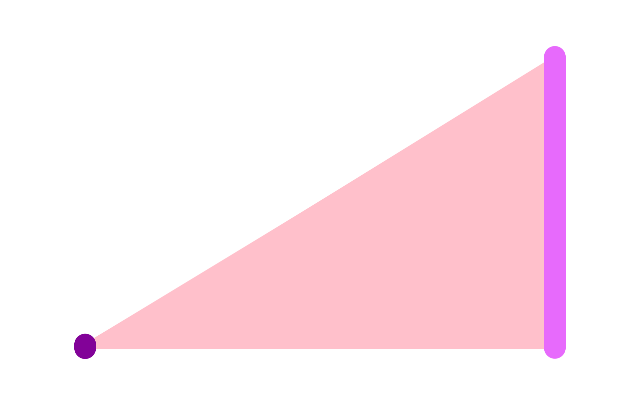

In [224]:
# manually set the node colours and positions
color_map, pos = {}, {}
for i, node in enumerate(u_nodes):
    pos[node] = (0, i*10)
    color_map[node] = '#820298'
for i, node in enumerate(h_nodes):
    pos[node] = (0.5, 15 + i*15)
    color_map[node] = '#e76afc'

# check if all nodes in Graph_Netz are in color_map
for node in Graph_Netz.nodes():
    if node not in color_map:
        pos[node] = (0.5, 0)
        color_map[node] = '#00ff00'

colors = [color_map[node] for node in Graph_Netz.nodes()]

# draw the network
plt.figure(figsize=(8, 5))
plt.margins(0.1, 0.1)
nx.draw_networkx(Graph_Netz, pos=pos, with_labels=False,
                 node_size=200, node_color=colors, edge_color='pink')
plt.axis('off')
plt.show()


The user-hashtag network is depicted above. We can see that hashtag nodes outnumber user nodes by a large margin. Due to the large number of nodes, it is difficult to extract any useful information from this, so I will plot smaller, more meaningful subgraphs throughout my exploration of the network.

sing the disturbution function to check User-hashtag network of the bipartite Network disturbution. 

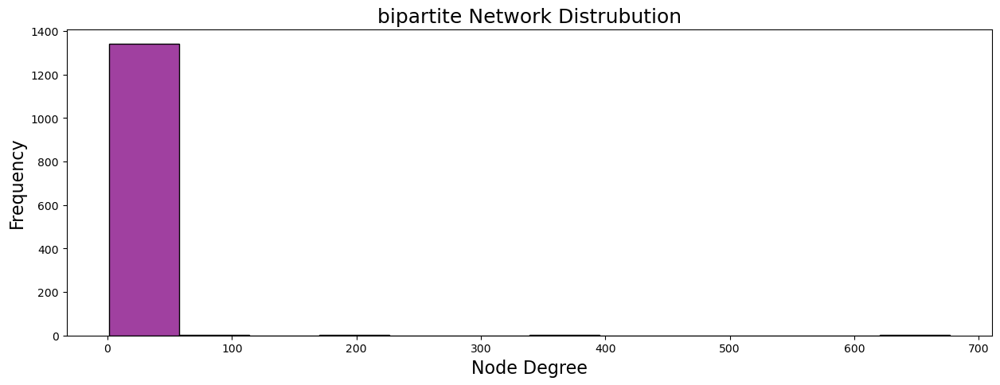

Degree Min: 1
Degree Max: 677
Mean degree: 2.438
Median degree: 1.0


In [225]:
# calling the disturbation function for biparte
degree_Disturbution_Function(Graph_Netz,"bipartite Network","purple")

As we can see for the bipartite Network The degree min is 1 and the max is 677 and The mean of the degree is 2.438 But most important is the median degree is 1.0

Now i will create a function to display the weight degree in the hashtags

In [226]:
# note we specify only the repository nodes
rep_wdegrees = dict(Graph_Netz.degree(h_nodes, weight="weight"))
# convert to a Pandas series and sort it
rep_swdeg = pd.Series(rep_wdegrees, name="w-degree")
rep_swdeg = rep_swdeg.sort_values(ascending=False)
# display the top 10
pd.DataFrame(rep_swdeg.head(10))

,w-degree
#apple,6
#amazon,6
#ai,6
#twitter,5
#metaverse,5
#data,5
#tech,5
#cybersecurity,5
#meta,4
#android,4


In [227]:
# note we specify only the user nodes
user_wdegrees = dict(Graph_Netz.degree(u_nodes, weight="weight"))
# convert to a Pandas series and sort it
user_swdeg = pd.Series(user_wdegrees, name="w-degree")
user_swdeg = user_swdeg.sort_values(ascending=False)
# display the top 10
pd.DataFrame(user_swdeg.head(10))

,w-degree
VentureBeat,677
gigaom,393
RWW,217
TechRepublic,88
TechCrunch,62
WIRED,41
techradar,21
TelegraphTech,21
technology,12
thenextweb,10


As we can see after Displaying the weight degress VentureBeat Has The most by far

user-hashtag bipartite network we are gonna get the The number od nodes and edges 

In [228]:
g = bipartite.weighted_projected_graph(Graph_Netz, h_nodes)
print( "Projected graph: %d nodes, %d edges" % ( g.number_of_nodes(), g.number_of_edges() ) )

Projected graph: 1319 nodes, 326012 edges


No gonn create a function for the Density of user-hashtag network

In [229]:
print("Density of user-hashtag network: ", nx.density(Graph_Netz))


Density of user-hashtag network:  0.001811300440911563


Cheking if the network is directed or not

In [230]:
print("Is user-hashtag network directed?: ", nx.is_directed(Graph_Netz))

Is user-hashtag network directed?:  False


now we are going to plot all the data together in one Dataframe So we can understyand and compare the Data Better This is gonna be displaye in Dataframe

In [231]:
# adding tables together as a dataframe 
First_Data = degree_centrality(Graph_Netz)
Second_Data =betweeness_centrality(Graph_Netz)
Third_Data =closeness_centrality(Graph_Netz)
#Fourth_Data = Eigen_Vector_centrality(Graph_Netz)

Calling the function to display it

In [304]:
# concating them here 
dataframe = pd.concat([First_Data, Second_Data,Third_Data],axis = 1)
#printing the results of the dataframe
dataframe.head(25)

,degree_Centrality,Betweeness_Centrality,Closeness_Centrality
gigaom,0.228794,0.000000,0.000000
techmeme,0.193031,0.000000,0.000000
venturebeat,0.133884,0.000115,0.000917
bitech,0.071068,0.000000,0.000000
techrepublic,0.063732,0.000000,0.000000
technology,0.053187,0.000000,0.000000
techcrunch,0.049060,0.000021,0.000459
telegraphtech,0.047685,0.000000,0.000000
wired,0.044017,0.000067,0.001376
techreview,0.032554,0.000000,0.000000


    function to see the correlatiion 

In [233]:
# checking the correlation between them 
dataframe.corr()

,degree_Centrality,Betweeness_Centrality,Closeness_Centrality
degree_Centrality,1.000000,0.994773,0.104699
Betweeness_Centrality,0.994773,1.000000,0.118622
Closeness_Centrality,0.104699,0.118622,1.000000


printing the edge when looping through to see which one is connected to from edges

In [234]:
# printing the edges in the user hasthag network
for edge in Graph_Netz.edges:
    print(edge)

('gigaom', '#ai')
('gigaom', '#ml')
('gigaom', '#edge')
('gigaom', '#edgecomputing')
('gigaom', '#webinar')
('gigaom', '#employees')
('gigaom', '#culture')
('gigaom', '#technology')
('gigaom', '#digital')
('gigaom', '#tech')
('gigaom', '#it')
('gigaom', '#workplace')
('gigaom', '#remote')
('gigaom', '#smartcity')
('gigaom', '#wireless')
('gigaom', '#connectivity')
('gigaom', '#lasvegas')
('gigaom', '#transformation')
('gigaom', '#automl')
('gigaom', '#machinelearning')
('gigaom', '#artificialintelligence')
('gigaom', '#deeplearning')
('gigaom', '#bigdata')
('gigaom', '#analytics')
('gigaom', '#datascience')
('gigaom', '#cloudcomputing')
('gigaom', '#mlops')
('gigaom', '#rpa')
('gigaom', '#roboticautomation')
('gigaom', '#data')
('gigaom', '#cloud')
('gigaom', '#hybrid')
('gigaom', '#b2b')
('gigaom', '#marketing')
('gigaom', '#content')
('gigaom', '#datawarehouses')
('gigaom', '#commvault')
('gigaom', '#enablement')
('gigaom', '#gigaom')
('gigaom', '#insights')
('gigaom', '#analysis')
(

Now we are gonna Display The go network for gigaom

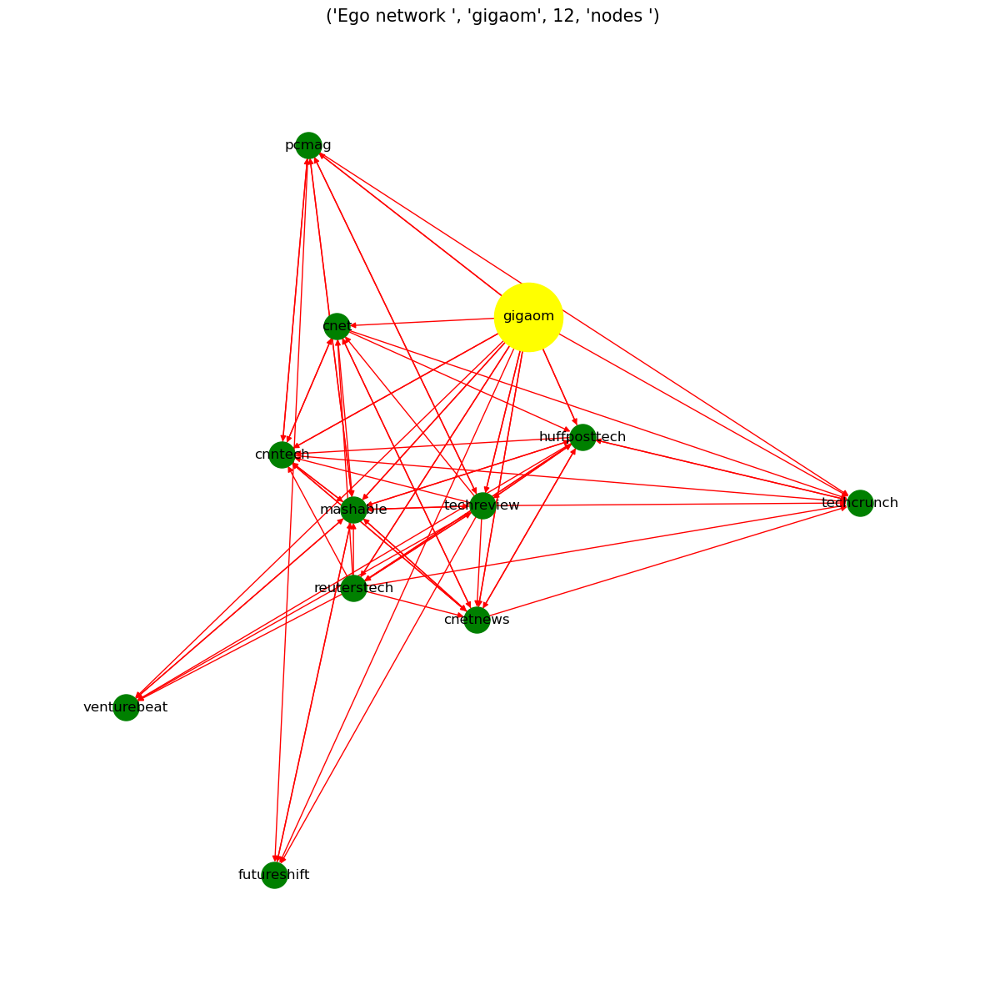

Number of nodes: 12
Number of edges: 73
Density 0.553


In [305]:
# calling the function of the user hasthag of  
display_ego(Graph_Netz,"gigaom")
plt.show()

Now we are gonna Display The go network for mashable

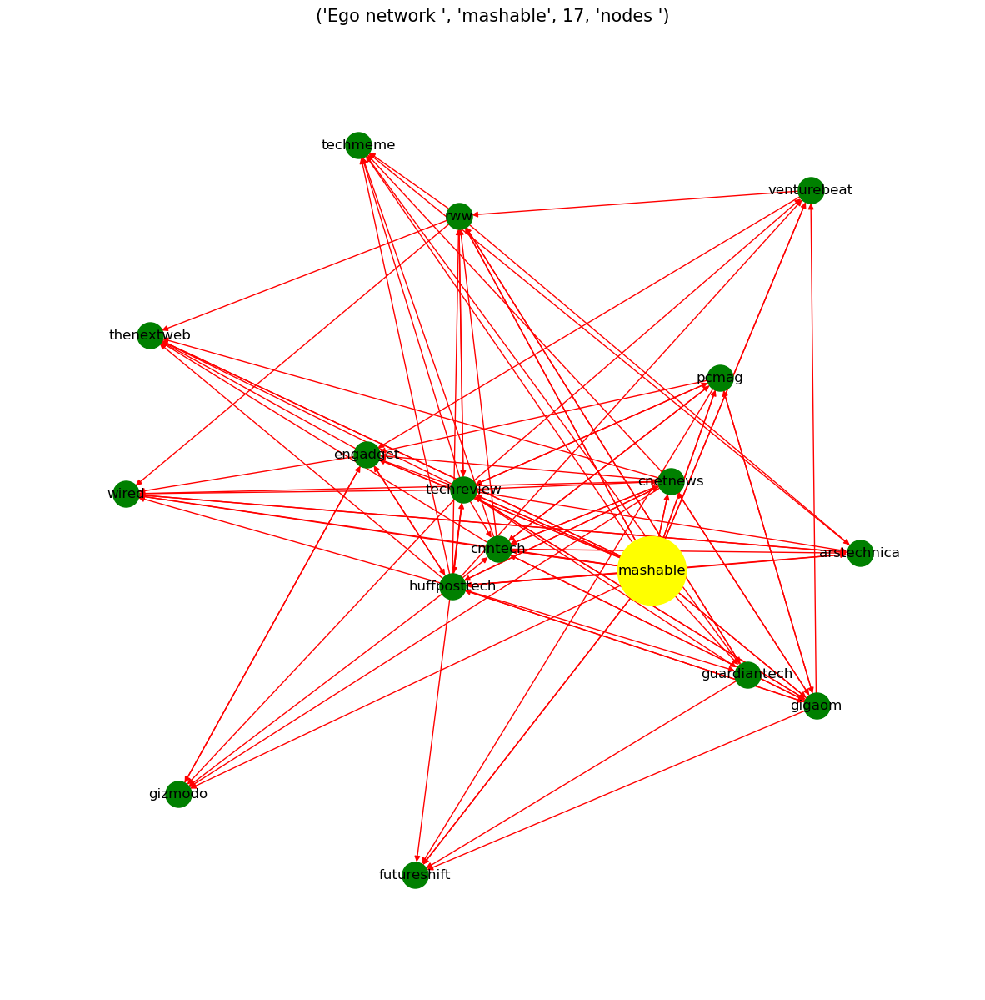

Number of nodes: 17
Number of edges: 102
Density 0.375


In [306]:
# calling the function of the user hasthag of 
display_ego(Graph_Netz,"mashable")
plt.show()

Now im gonna Use The software Gephi To visulaze user_hasthag_network We can see That this network contains 1347 Nodes and 1642 edges i added a NoverLap layout type i found This was the perfect layout for this network and also chose a black background to show The nodes and edges Much more   

In [237]:
nx.write_gexf(Graph_Netz, 'user_hasthag_network.gexf', prettyprint=True)

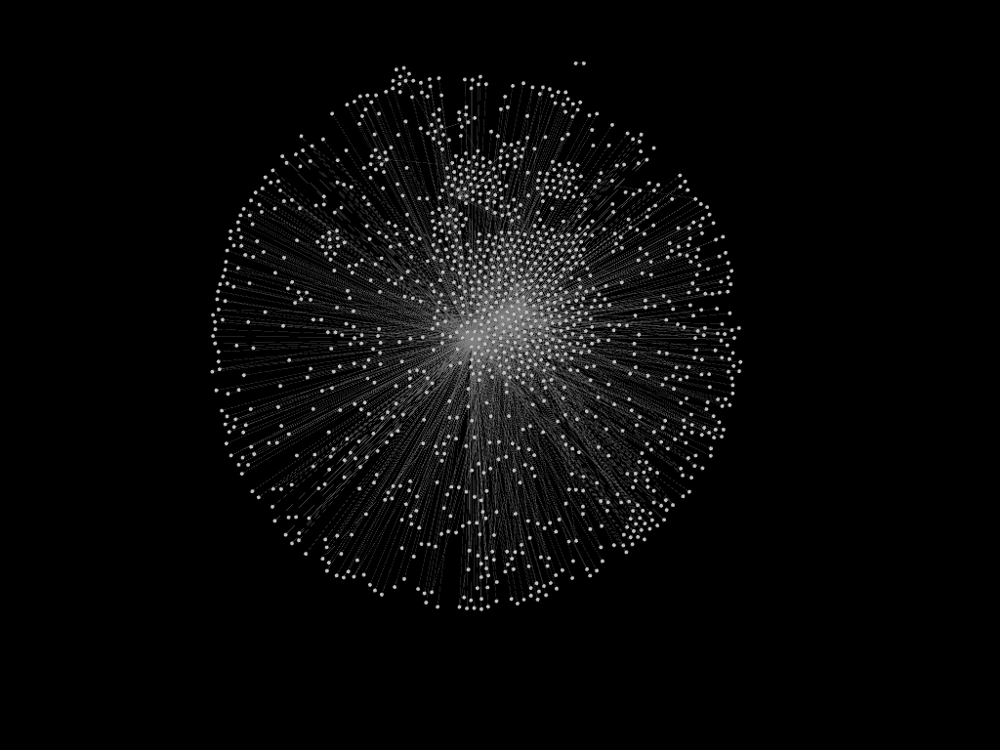# 

# Task 5 Hashtag co-occurrence network:

The hashtag co-occurrence network is a weighted, undirected network in which each node will represent a hashtag, and the weight on each edge will indicate the number of tweets that the two hashtags appeared together in.

store in temp if teh statement is true , and keep loopin around teh hasthag that are occured untill it reached the id.

In [238]:
Hashtgz_Netz={}
##creating an ideed dictionary where the values are all co-appearing hashtags in a list.
for i, row in tweets_df.iterrows():
    if len(row["entities"]["hashtags"]) > 0:
        temp=[]
        for j in range(0,len(row["entities"]["hashtags"])):
            temp.append("#{}".format((row["entities"]["hashtags"][j]["text"]).lower()))
            
        Hashtgz_Netz[row["id"]]=temp 

In [239]:
# create an undirected network
fifth_Graph_netz = nx.Graph()
for h in Hashtgz_Netz:
    # get all unique pairs of individuals from this meeting
    for pair in itertools.combinations(Hashtgz_Netz[h], r=2):
        # do we have the edge already? if so, increment the weight on the edge
        if fifth_Graph_netz.has_edge(pair[0], pair[1]):
            fifth_Graph_netz[pair[0]][pair[1]]["weight"] += 1
        # otherwise create a new edge with a weight of 1
        else:
            fifth_Graph_netz.add_edge(pair[0], pair[1], weight=1)

In [240]:
# printing the foloeing edges in the co-occurence network
for edge in fifth_Graph_netz.edges:
    print(edge)

('#ai', '#ml')
('#ai', '#edge')
('#ai', '#edgecomputing')
('#ai', '#automl')
('#ai', '#machinelearning')
('#ai', '#artificialintelligence')
('#ai', '#deeplearning')
('#ai', '#bigdata')
('#ai', '#analytics')
('#ai', '#datascience')
('#ai', '#cloudcomputing')
('#ai', '#mlops')
('#ai', '#technology')
('#ai', '#timeseriesdata')
('#ai', '#nvidia')
('#ai', '#rescale')
('#ai', '#hpc')
('#ai', '#edgeai')
('#ai', '#computervision')
('#ai', '#vbtransform')
('#ai', '#lcnc')
('#ai', '#cybersecurity')
('#ai', '#deloitte')
('#ai', '#datapipelines')
('#ai', '#datamanagement')
('#ai', '#medicalai')
('#ai', '#creativity')
('#ai', '#semiconductor')
('#ai', '#security')
('#ai', '#risk')
('#ai', '#tech')
('#ai', '#it')
('#ai', '#data')
('#ai', '#enterpriseit')
('#ai', '#datastorage')
('#ai', '#cloud')
('#ai', '#devops')
('#ai', '#marketing')
('#ai', '#automations')
('#ai', '#business')
('#ai', '#marketers')
('#ai', '#enterprise')
('#ai', '#storage')
('#ai', '#strategy')
('#ai', '#healthcare')
('#ai', '#ap

Checking if it's connected or not

In [241]:
# checking if the co-ocuurence network is directed
print(f"Connected? {nx.is_directed(fifth_Graph_netz)}")

Connected? False


Not Directed graph

Network Density

To characterise the network structure we can look at the network density. Network density refers to the portion of potential edges between nodes in a network that exist as actual edges.

Density is calculated numerically as the ratio of existing edges over the total number of potential edges between all pairs of nodes.

In [242]:
print(f"The density of the user-hashtag graph is {nx.density(fifth_Graph_netz)}")


The density of the user-hashtag graph is 0.0057591478463168725


Number of nodes and edges

In [243]:
# calling the function for co-occurence network
NetworkNodesAndEdges(fifth_Graph_netz)

Number of nodes: 1077
Number of edges: 3337


Clustering Coefficient

Clustering coefficient indicates the level of concentration of edges in the neighbourhood of a node. It is the fraction of pairs of its neighbours that have edges between one another - i.e. how many closed triads around this node.

In [299]:
print("Average Clustering Coefficient: %.4f " % nx.average_clustering(fifth_Graph_netz))


Average Clustering Coefficient: 0.6049 


In [246]:
# storing edges to dataframe pandas and descending them from weight
weight_counter = nx.to_pandas_edgelist(fifth_Graph_netz)
weight_counter.sort_values(by='weight', ascending=False).head(15)

,source,target,weight
429,#technews,#technology,665
283,#tech,#it,41
293,#tech,#data,36
712,#it,#data,30
2502,#arcsight,#siem,28
827,#metabeat,#metaverse,27
35,#ai,#cloud,27
1273,#data,#cloud,26
1438,#cloud,#devops,26
294,#tech,#cloud,25


Now im gonna plot a degree_Disturbution_Function To show the Co-occurence Network

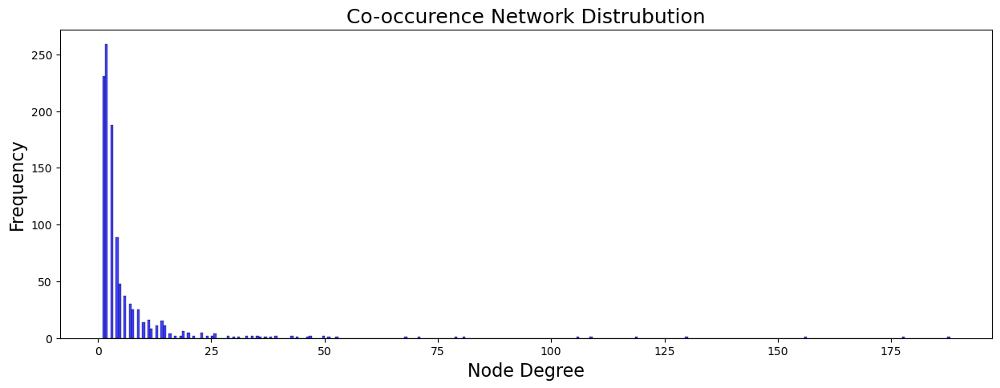

Degree Min: 1
Degree Max: 188
Mean degree: 6.197
Median degree: 3.0


In [247]:
degree_Disturbution_Function(fifth_Graph_netz,"Co-occurence Network","Blue")

As we can see that for the degree min is 1 and the max is 188 and the mean of the degree is 6.197 and the Median degree is 3.0


Degree centrality can be computed by dividing the node degree scores by the maximum possible degree in the network, i.e., n-1, where n is the number of nodes in the network. It is appropriate when the number of connections in the network is important.

In [248]:
centrality_df = pd.DataFrame.from_dict(dict(nx.degree_centrality(
    fifth_Graph_netz)), orient='index', columns=['degree_centrality'])
centrality_df.sort_values(by='degree_centrality', ascending=False).head(10)

,degree_centrality
#ai,0.174721
#data,0.165428
#tech,0.144981
#cloud,0.120818
#cybersecurity,0.110595
#it,0.101301
#security,0.098513
#metaverse,0.075279
#devops,0.073420
#technology,0.065985


Betweenness centrality: This metric captures a different view of the importance of a node. The previous centrality measures do not capture the idea of brokerage. Betweenness centrality identifies strategic linkages, “brokers” or “bridging nodes” in a network. It finds the bottleneck nodes in a network, Betweenness centrality assumes that the nodes which connect most of the other nodes in the shortest possible way are most important.

In [249]:
centrality_df['wt_betweenness'] = pd.Series(dict(
    nx.betweenness_centrality(fifth_Graph_netz, weight='weight')))
centrality_df[['wt_betweenness']].sort_values(
    by='wt_betweenness', ascending=False).head(10)

,wt_betweenness
#ai,0.161637
#tech,0.103473
#data,0.102502
#cybersecurity,0.099545
#security,0.087641
#metaverse,0.050886
#cloud,0.047282
#web3,0.041459
#machinelearning,0.033275
#technology,0.031242


Closeness centrality:The closeness centrality of a node is defined as the reciprocal mean distance from the node to all other reachable nodes in the network. It shows how close the node is to the rest of the graph. This is again a global metric as it does not depend only on the nodes neighbourhood, indicates nodes as more central if they are closer to most of the nodes in the graph. It can be regarded as a measure of how fast it will take to spread information to all other nodes

In [250]:
centrality_df['closeness'] = pd.Series(dict(
    nx.closeness_centrality(fifth_Graph_netz)))
centrality_df[['closeness']].sort_values(
    by='closeness', ascending=False).head(10)

,closeness
#ai,0.427155
#data,0.418987
#tech,0.408433
#security,0.404359
#cloud,0.399183
#cybersecurity,0.390342
#devops,0.379560
#technology,0.376039
#it,0.371558
#digital,0.365527


Now im going to put them all together in one Dataframe so we can understand the Data Better

In [251]:
centrality_df.sort_values(by='wt_betweenness', ascending=False)

,degree_centrality,wt_betweenness,closeness
#ai,0.174721,1.616366e-01,0.427155
#tech,0.144981,1.034727e-01,0.408433
#data,0.165428,1.025017e-01,0.418987
#cybersecurity,0.110595,9.954524e-02,0.390342
#security,0.098513,8.764116e-02,0.404359
#metaverse,0.075279,5.088598e-02,0.357785
#cloud,0.120818,4.728155e-02,0.399183
#web3,0.047398,4.145896e-02,0.341652
#machinelearning,0.049257,3.327507e-02,0.346618
#technology,0.065985,3.124176e-02,0.376039


Plotting The correlatin Between Them

In [252]:
# caalculating the corrallation of the dataframe of the co-occurence network
centrality_df.corr()

,degree_centrality,wt_betweenness,closeness
degree_centrality,1.000000,0.904684,0.341212
wt_betweenness,0.904684,1.000000,0.252024
closeness,0.341212,0.252024,1.000000


Heatmap For the corralation.

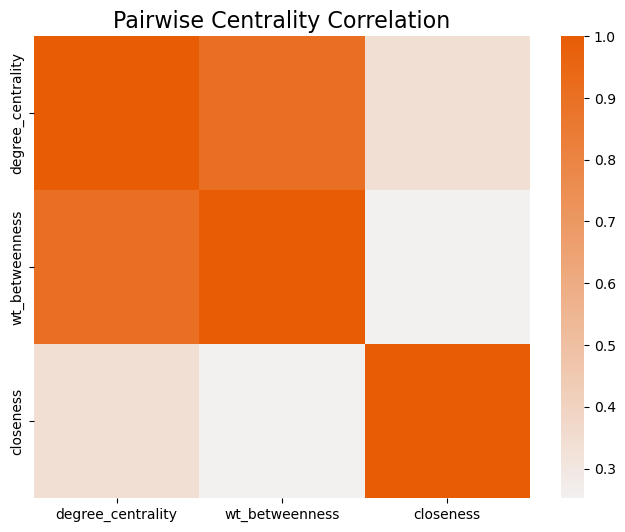

In [253]:
plt.figure(figsize=(8, 6))
sns.heatmap(data=centrality_df.corr(),
            cmap=sns.light_palette('#e85d04', as_cmap=True))
plt.title('Pairwise Centrality Correlation', fontsize=16)
plt.show()

As wee can see from the heatm map there is strong Correlation Between then as it's shown is the Heatmap

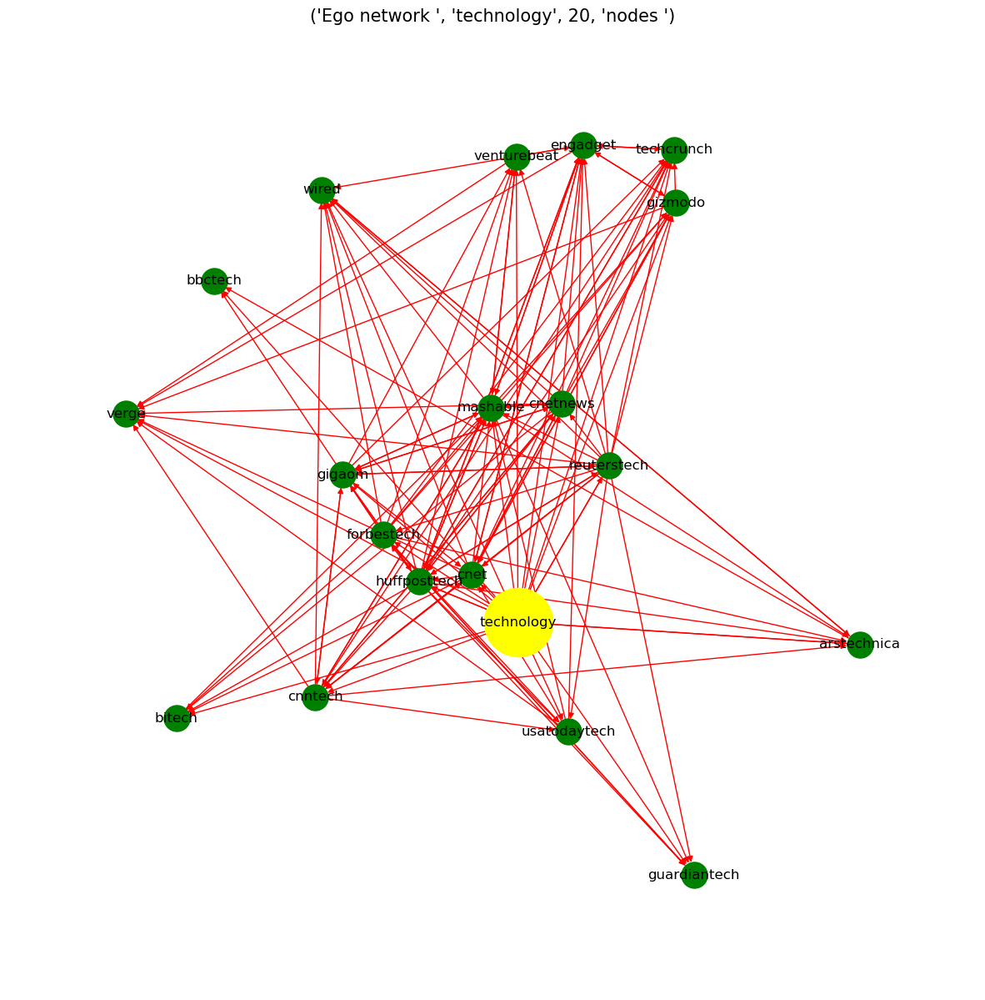

Number of nodes: 20
Number of edges: 136
Density 0.358


In [254]:
# calling the function of the co-occurence of 
display_ego(fifth_Graph_netz,"technology")
plt.show()

Now i will use Gephi To vizualize The network for co-occurence_network W can see That this is a big Netowk it contains 1077 Nodes and 3337 edges. Some modifiction i did So we can vzulaze The network Better is i chose a fructchman Reingold layout and Displayed The text ont he nodes and showes the edges 

In [255]:
nx.write_gexf(fifth_Graph_netz, 'co-occurence_network.gexf', prettyprint=True)

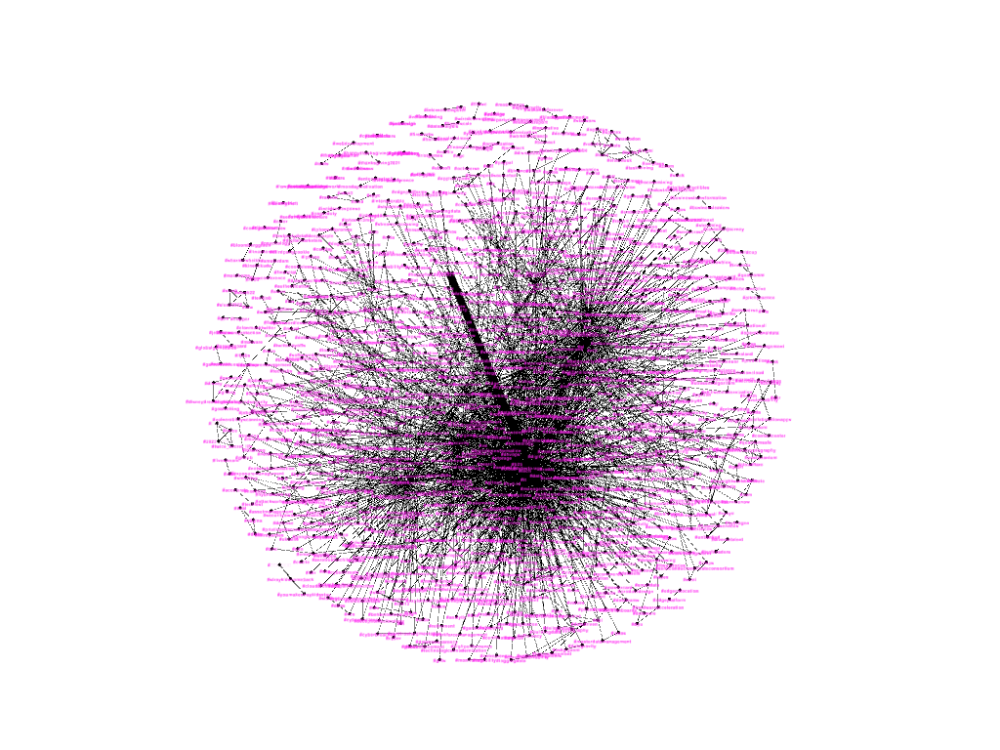# 

# Task 6 Dynamic follower network:


In [315]:
df1 = pd.read_csv("followers.csv", sep="\t", parse_dates=["date"])
df1.head(10)

,source,target,date
0,engadget,huffposttech,2020-10-16
1,mashable,gigaom,2021-04-09
2,huffposttech,cnetnews,2021-06-22
3,huffposttech,mashable,2021-07-02
4,techradar,wired,2022-02-23
5,reuterstech,cnetnews,2020-04-24
6,gigaom,techreview,2020-06-08
7,forbestech,guardiantech,2021-05-15
8,pcmag,techcrunch,2020-08-17
9,techreview,rww,2021-01-01


In [316]:
df1["date"].min(), df1["date"].max()

(Timestamp('2020-01-05 00:00:00'), Timestamp('2022-12-31 00:00:00'))

Based on the range of the date, we will decide to split the data into yearly time windows - i.e. 2020 to 2022.

In [318]:
years = list(range(2020,2022))

In [319]:
window_frames = {}
for year in years:
    win_start = datetime(year, 1, 1)
    win_end = datetime(year, 12, 31 )
    window_frames[year] = df1[(df1["date"]>=win_start) & (df1["date"]<=win_end)]
    print("Window %d: Date >= %s and < %s -> %d follows" 
          % ( year, win_start.date(), win_end.date(), len(window_frames[year]) ) )

Window 2020: Date >= 2020-01-01 and < 2020-12-31 -> 119 follows
Window 2021: Date >= 2021-01-01 and < 2021-12-31 -> 62 follows


From these we can create an undirected network for each time window:

In [321]:
window_networks = {}
for year in years:
    # create a directed network from the corresponding DataFrame
    g = nx.from_pandas_edgelist(window_frames[year], "source", "target", create_using=nx.DiGraph())  
    print("Window %d network has %d nodes, %d edges" % ( year, g.number_of_nodes(), g.number_of_edges()  ) )
    window_networks[year] = g

Window 2020 network has 32 nodes, 119 edges
Window 2021 network has 30 nodes, 62 edges


We could visualise the different window networks. Note that these plots only show the following edges which were created in a given year.

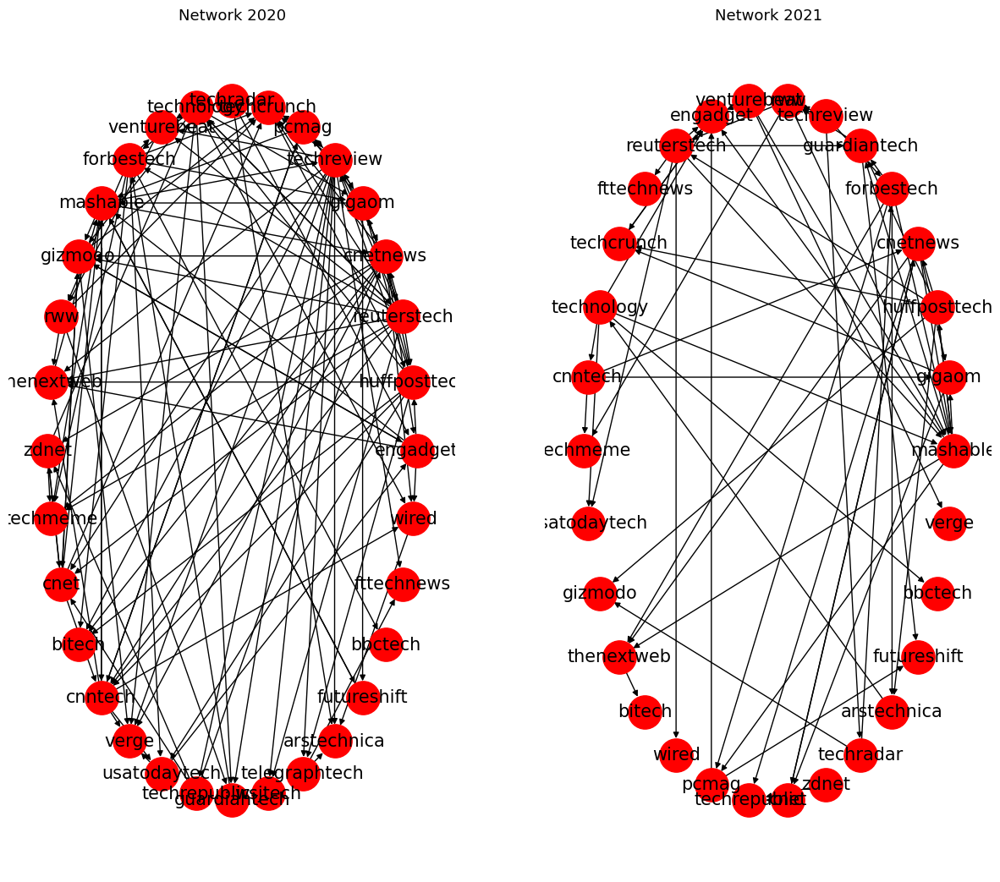

In [330]:
fig, ax = plt.subplots(1, 2, figsize=(15,13))
row, col = 0, 0
for i, year in enumerate(years[:2]):
    pos = nx.circular_layout(window_networks[year])
    # draw the network as a subplot
    nx.draw_networkx(window_networks[year], pos, 
                     ax=ax[col],
                     with_labels=True, font_size=15, node_size=800, node_color="Red")
    ax[col].set_title("Network %d" % year, fontsize=13)
    ax[col].set_axis_off()
    col += 1


Now we are going To compute the density and reciprocity in each time time window.

In [331]:
rows = []
for year in years:
    row = { "Year" : year, 
           "Density" : nx.density(window_networks[year]), 
           "Reciprocity" : nx.reciprocity(window_networks[year]) } 
    rows.append(row)
df_stats1 = pd.DataFrame(rows).set_index("Year")
df_stats1

,Density,Reciprocity
Year,,
2020,0.119960,0.168067
2021,0.071264,0.129032


As you can see in the DataFrame it displaye the years we have which is 2020 and 2021

Now what we are going to do is plot the changes over time 

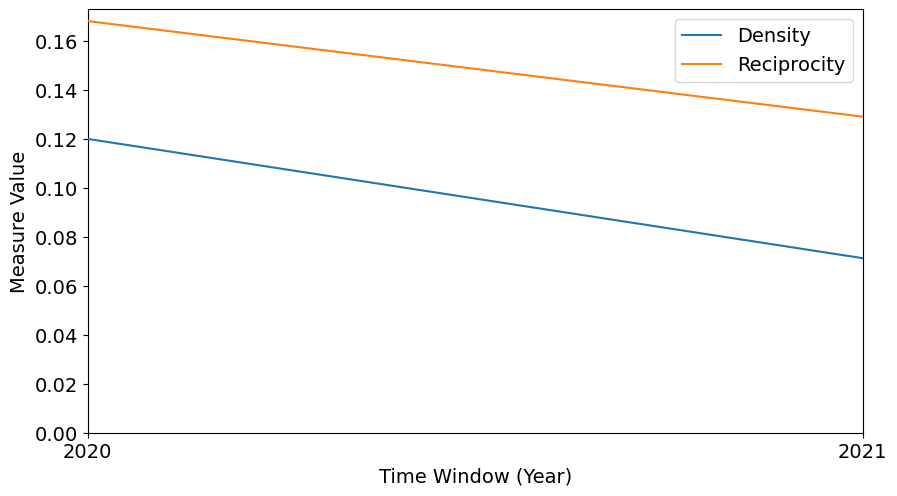

In [332]:
ax = df_stats1.plot(figsize=(10,5.5), fontsize=14, zorder=3)
# specify labels for the axes
ax.set_xlabel("Time Window (Year)", fontsize=14)
ax.set_ylabel("Measure Value", fontsize=14)
ax.legend(fontsize=14)
# tweak the appearance of the axes
ax.set_xticks(years)
ax.set_ylim(0)
ax.set_xlim(years[0], years[-1])
ax.xaxis.grid();

# Conclusion

This assignment was a lot of fun for me. It was fascinating to put all of the various centrality measures discussed in class into practice on a real-world example. It was fascinating to compare such disparate networks, working with directed, undirected, weighted, unweighted, and bipartite networks all at the same time. I seemed to be able to gain a better understanding of each of the various types of networks and why they produce specific outputs that differentiate them from one another. This was probably the most difficult aspect of the project, but it was also one of my absolute favourites. Overall, I found this project to be very enjoyable, and I have thoroughly enjoyed this module.